Procedurally-generated environment consists of a small set of $K$ input symbols and a set of $K$ output symbols.
The meta learner is expected to generalize over the sets of symbols.

In [8]:
# aaaabbbb

import torch.nn as nn
import torch
import matplotlib.pyplot as plt
from tqdm import trange

In [18]:
I, O = 16, 32
K = 8
T = 24
Nbatch = 31
Nalphabets_train, Nalphabets_valid = 10000, 100

train_inputs = [nn.Embedding(K, I) for _ in range(Nalphabets_train)]
train_outputs = [nn.Embedding(K, O) for _ in range(Nalphabets_train)]

valid_inputs = [nn.Embedding(K, I) for _ in range(Nalphabets_valid)]
valid_outputs = [nn.Embedding(K, O) for _ in range(Nalphabets_valid)]

pad = torch.zeros(Nbatch, O)

In [19]:
def make_sequences(inputs, generator=None):
    alphabets = torch.randint(0, len(inputs), (Nbatch,), generator=generator)
    sequences = torch.randint(0, K, (Nbatch, T), generator=generator)
    return alphabets, sequences

@torch.inference_mode()
def make_batch(inputs, outputs, generator=None):
    alphabets, sequences = make_sequences(inputs, generator)

    all_inputs = torch.stack([
        torch.stack([inputs[i](s) for s in seq])
        for i, seq in zip(alphabets, sequences)
    ]).transpose(0,1)
    all_targets = torch.stack([
        torch.stack([pad[0]] + [outputs[i](s) for s in seq])
        for i, seq in zip(alphabets, sequences)
    ]).transpose(0,1)

    nar_x = torch.cat([all_inputs, torch.zeros_like(all_targets[:-1])], dim=-1)
    x = torch.cat([all_inputs, all_targets[:-1]], dim=-1)
    return x, nar_x, all_targets[1:]

In [20]:
# magic sequence
make_sequences(valid_inputs, generator=torch.Generator().manual_seed(0))[1][0]

tensor([4, 3, 0, 3, 5, 6, 7, 7, 0, 2, 3, 0, 1, 3, 5, 3, 3, 6, 7, 0, 1, 1, 1, 7])

In [21]:
class Model(nn.Module):
    def __init__(self, hidden=512):
        super().__init__()
        self.readin = nn.Linear(I+O, hidden)
        self.readout = nn.Linear(hidden, O)
        self.hidden = hidden
        self.rnn = nn.LSTM(hidden, hidden, num_layers=1)

    def forward(self, x):
        return self.readout(self.rnn(self.readin(x))[0])

  1%|          | 100/10000 [00:03<04:56, 33.39it/s, loss=0.95, nar_loss=1.01]  

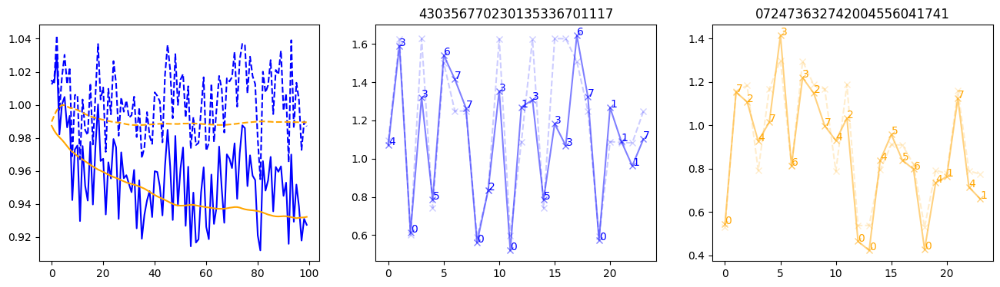

  2%|▏         | 200/10000 [00:06<05:01, 32.48it/s, loss=0.937, nar_loss=1]    

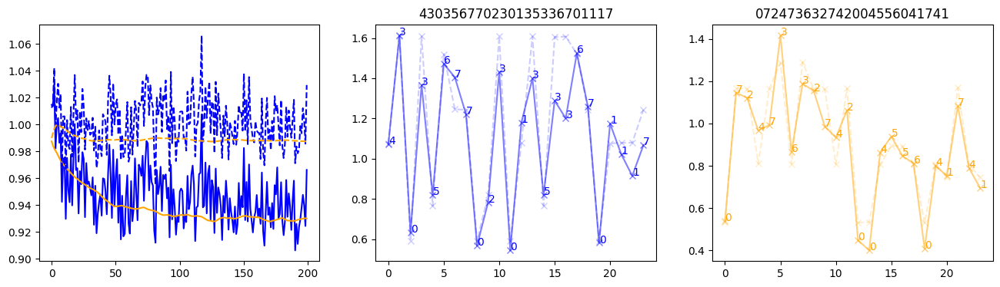

  3%|▎         | 300/10000 [00:09<04:59, 32.37it/s, loss=0.942, nar_loss=0.999]

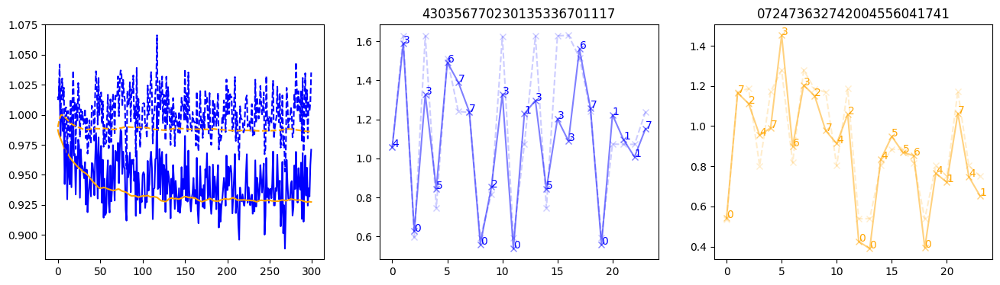

  4%|▍         | 400/10000 [00:13<04:53, 32.70it/s, loss=0.917, nar_loss=0.982]

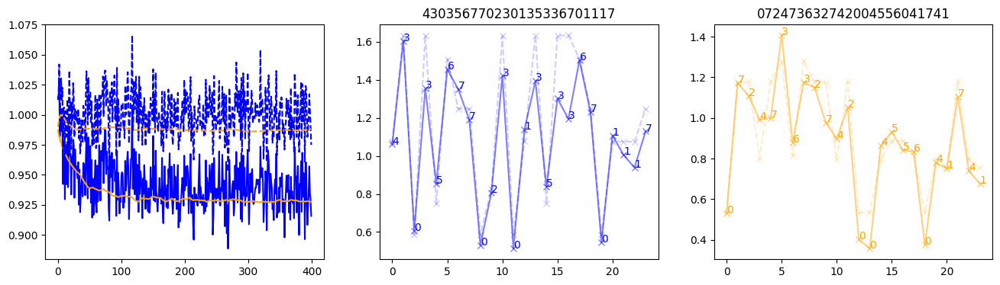

  5%|▌         | 500/10000 [00:16<04:46, 33.15it/s, loss=0.937, nar_loss=0.997]

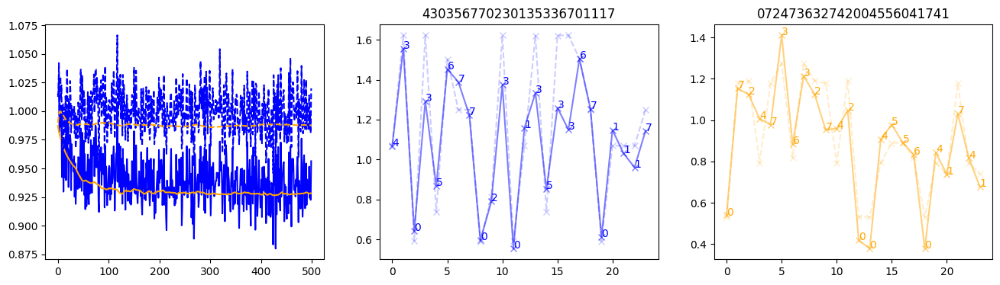

  6%|▌         | 600/10000 [00:19<04:43, 33.19it/s, loss=0.948, nar_loss=1.01] 

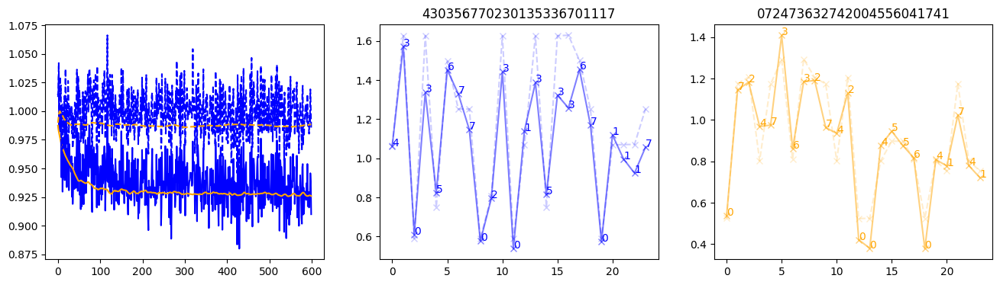

  7%|▋         | 700/10000 [00:23<04:43, 32.79it/s, loss=0.923, nar_loss=0.992]

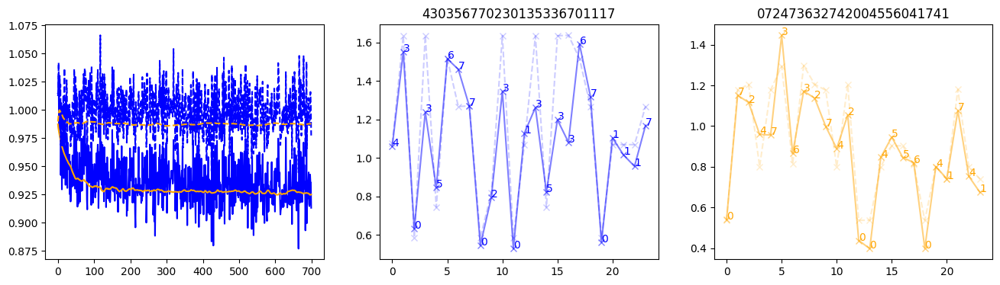

  8%|▊         | 800/10000 [00:26<04:44, 32.34it/s, loss=0.931, nar_loss=1.01] 

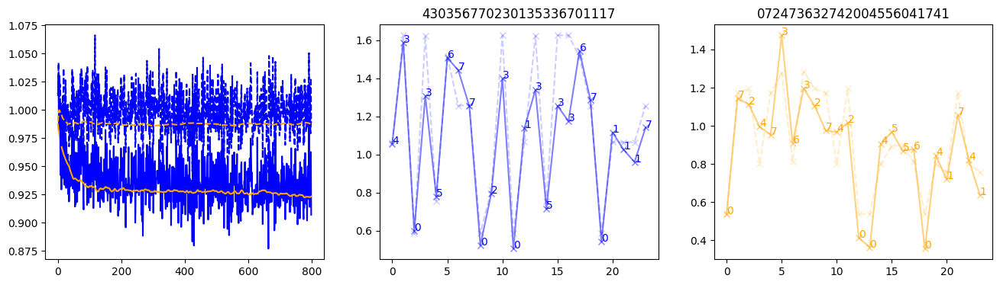

  9%|▉         | 900/10000 [00:30<04:40, 32.39it/s, loss=0.926, nar_loss=0.998]

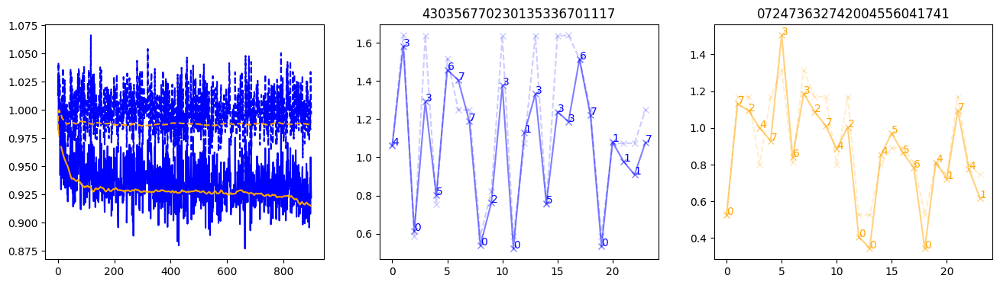

 10%|█         | 1000/10000 [00:33<04:34, 32.75it/s, loss=0.898, nar_loss=1.01]

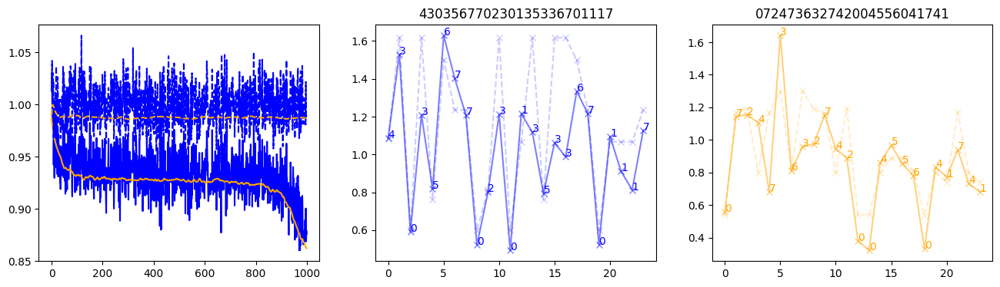

 11%|█         | 1100/10000 [00:37<04:32, 32.66it/s, loss=0.849, nar_loss=0.996]

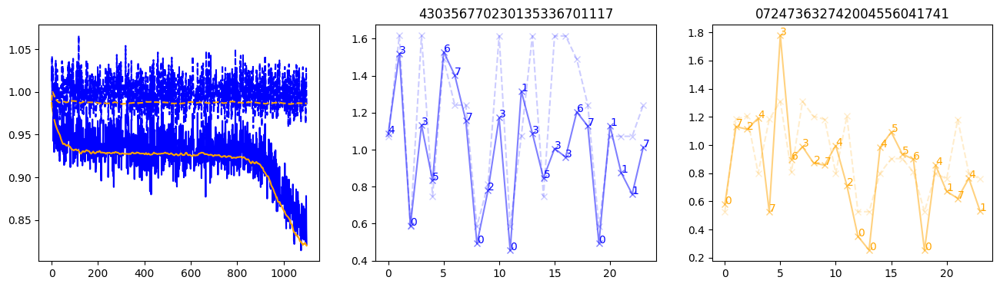

 12%|█▏        | 1200/10000 [00:40<04:32, 32.33it/s, loss=0.819, nar_loss=0.982]

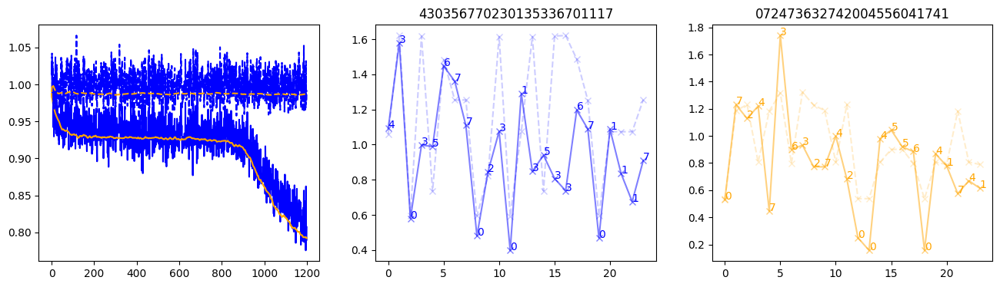

 13%|█▎        | 1300/10000 [00:44<04:28, 32.37it/s, loss=0.766, nar_loss=0.958]

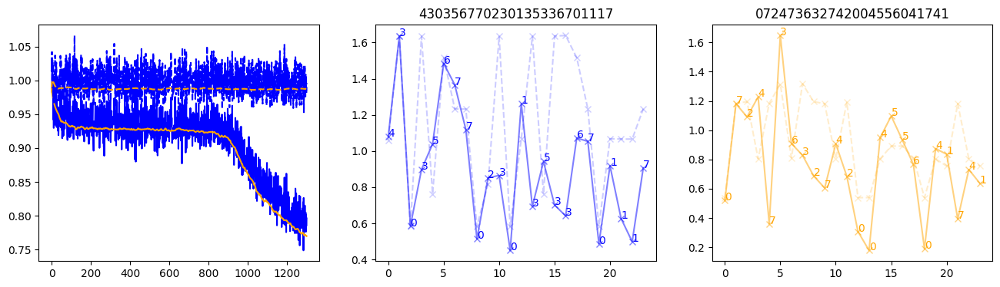

 14%|█▍        | 1400/10000 [00:47<04:26, 32.22it/s, loss=0.771, nar_loss=0.981]

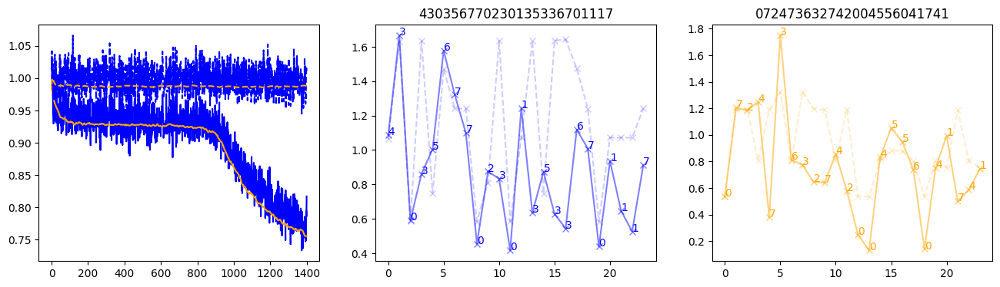

 15%|█▌        | 1500/10000 [00:51<04:19, 32.74it/s, loss=0.768, nar_loss=1]    

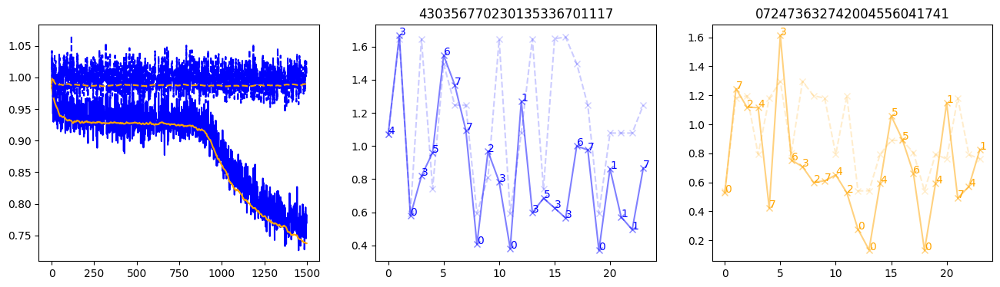

 16%|█▌        | 1600/10000 [00:54<04:17, 32.67it/s, loss=0.744, nar_loss=0.959]

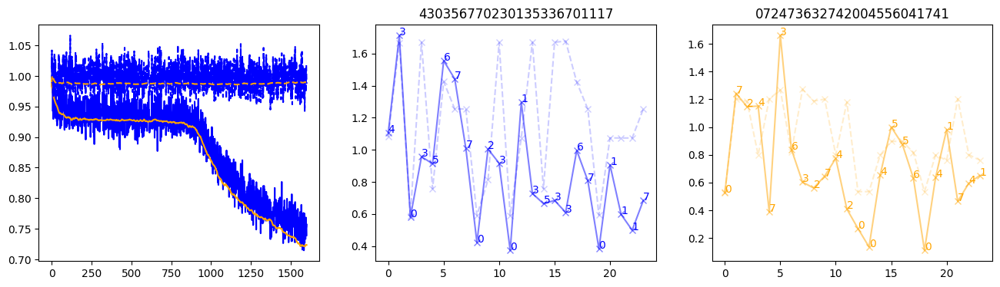

 17%|█▋        | 1700/10000 [00:57<04:15, 32.48it/s, loss=0.744, nar_loss=1.02] 

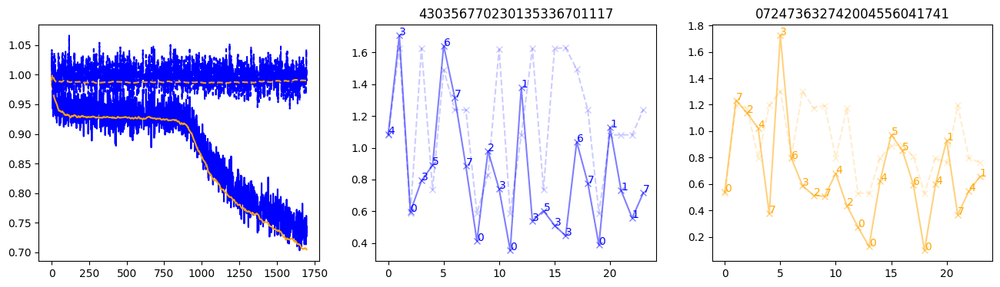

 18%|█▊        | 1800/10000 [01:01<04:13, 32.35it/s, loss=0.729, nar_loss=0.997]

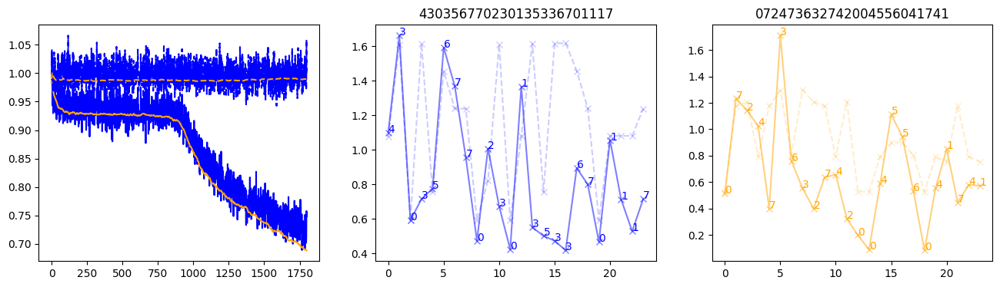

 19%|█▉        | 1900/10000 [01:05<04:08, 32.59it/s, loss=0.719, nar_loss=0.995]

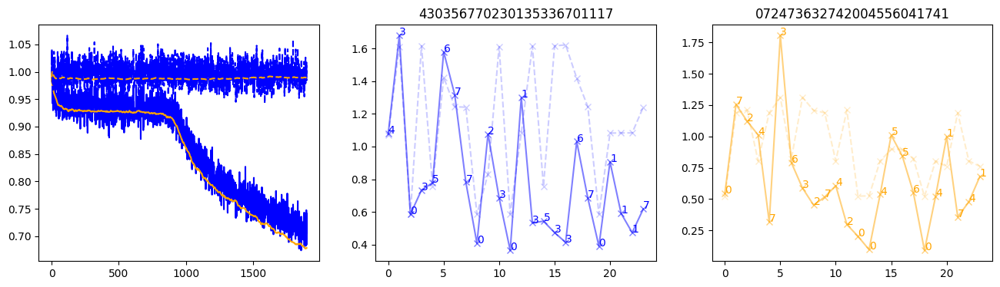

 20%|██        | 2000/10000 [01:08<04:09, 32.02it/s, loss=0.722, nar_loss=1]    

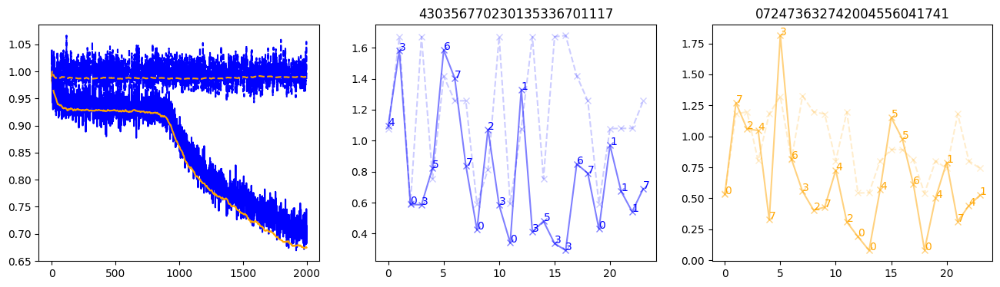

 21%|██        | 2100/10000 [01:12<04:06, 32.01it/s, loss=0.698, nar_loss=0.981]

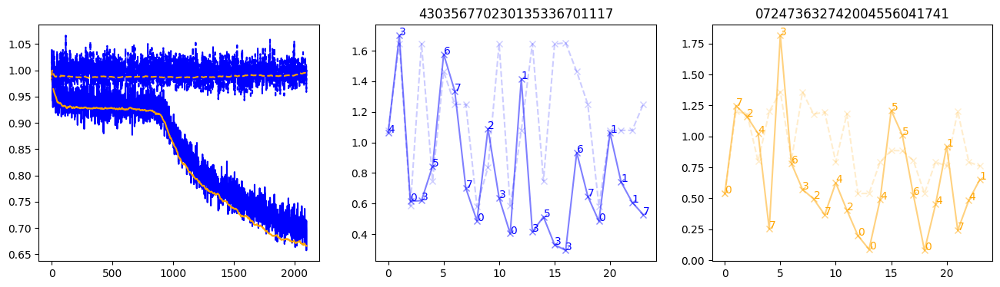

 22%|██▏       | 2200/10000 [01:15<04:01, 32.25it/s, loss=0.702, nar_loss=0.985]

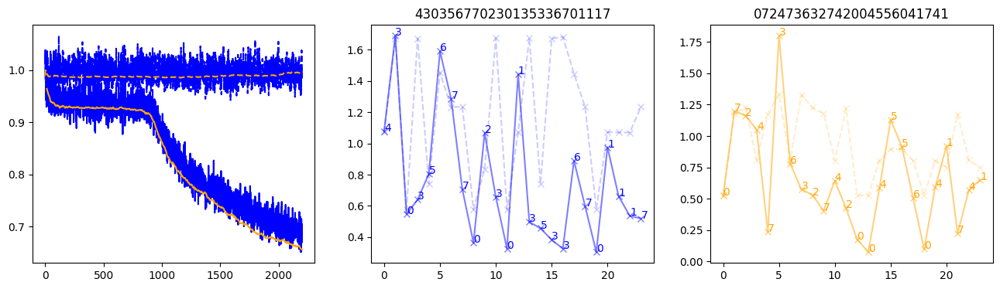

 23%|██▎       | 2300/10000 [01:19<03:55, 32.66it/s, loss=0.67, nar_loss=0.995] 

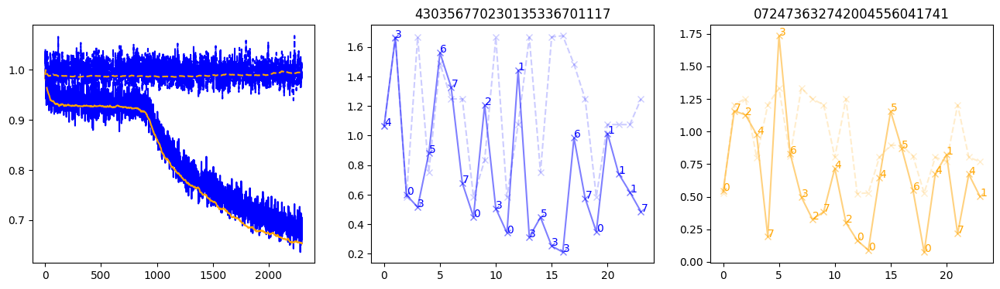

 24%|██▍       | 2400/10000 [01:22<03:50, 32.98it/s, loss=0.677, nar_loss=1.01] 

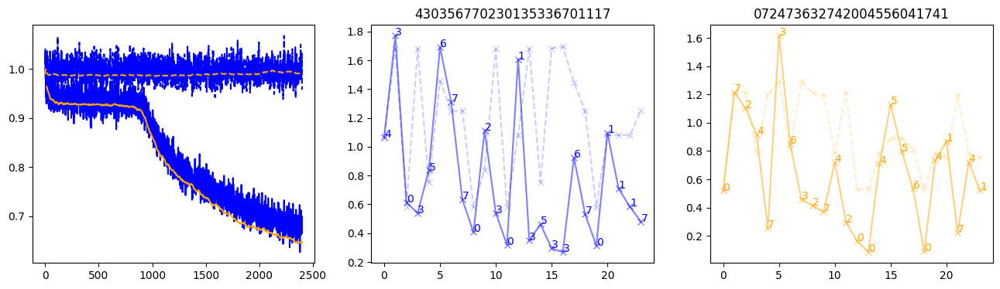

 25%|██▌       | 2500/10000 [01:26<03:52, 32.28it/s, loss=0.665, nar_loss=0.979]

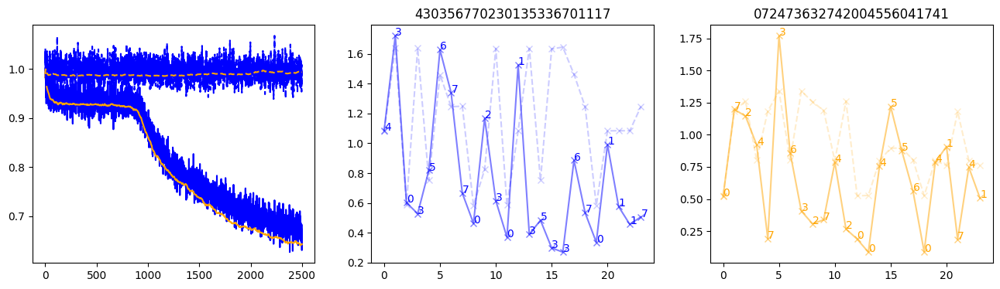

 26%|██▌       | 2600/10000 [01:29<03:47, 32.47it/s, loss=0.676, nar_loss=1.01] 

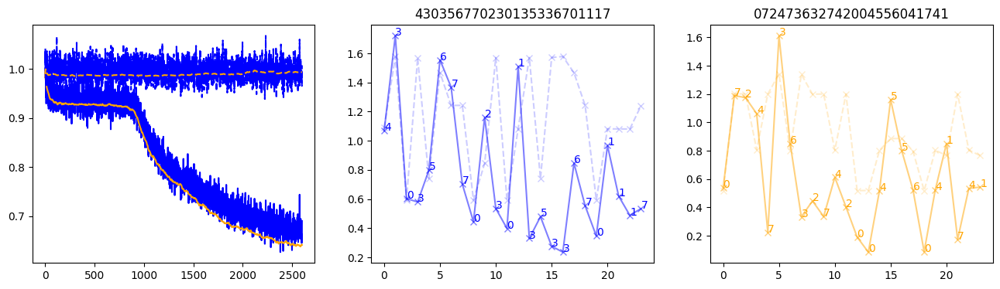

 27%|██▋       | 2700/10000 [01:33<03:45, 32.35it/s, loss=0.667, nar_loss=0.999]

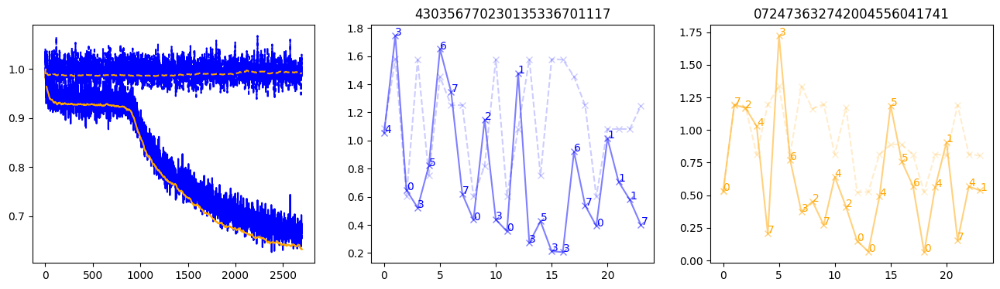

 28%|██▊       | 2800/10000 [01:36<03:38, 32.91it/s, loss=0.663, nar_loss=0.986]

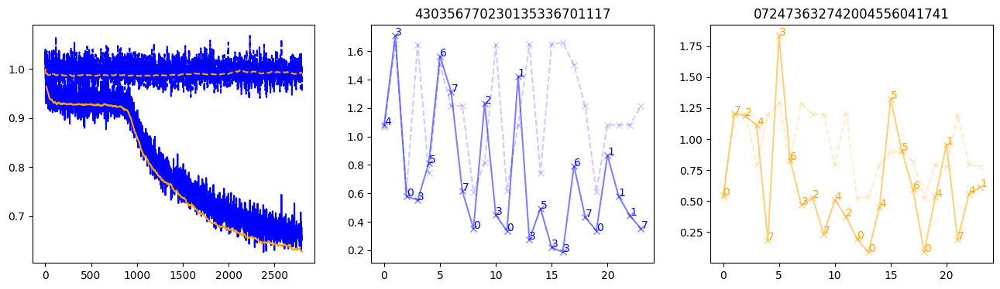

 29%|██▉       | 2900/10000 [01:40<03:37, 32.69it/s, loss=0.655, nar_loss=0.985]

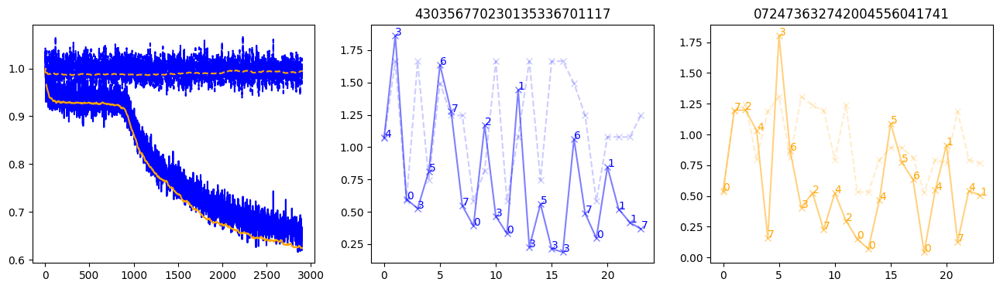

 30%|███       | 3000/10000 [01:43<03:37, 32.19it/s, loss=0.669, nar_loss=0.992]

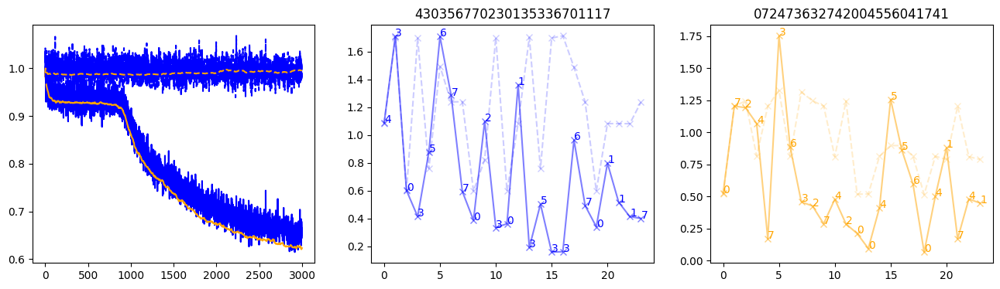

 31%|███       | 3100/10000 [01:47<03:33, 32.31it/s, loss=0.668, nar_loss=1]    

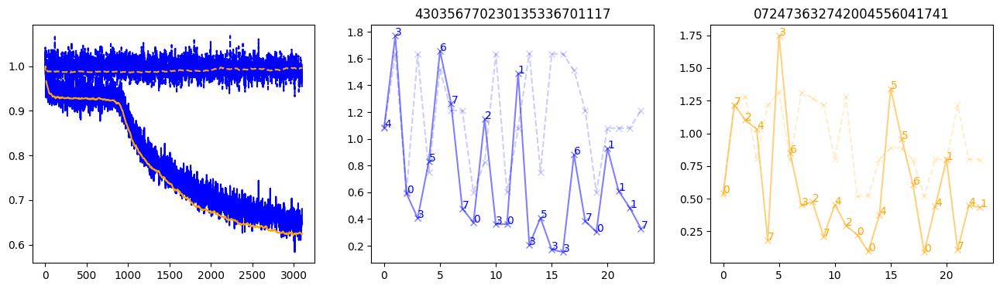

 32%|███▏      | 3200/10000 [01:50<03:25, 33.16it/s, loss=0.675, nar_loss=1.02] 

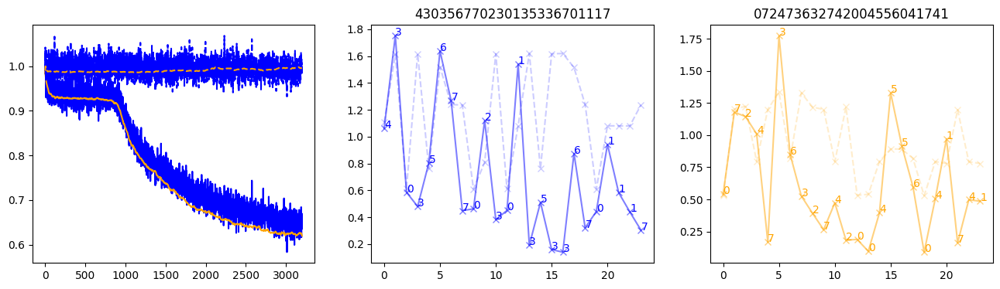

 33%|███▎      | 3300/10000 [01:54<03:27, 32.22it/s, loss=0.662, nar_loss=0.978]

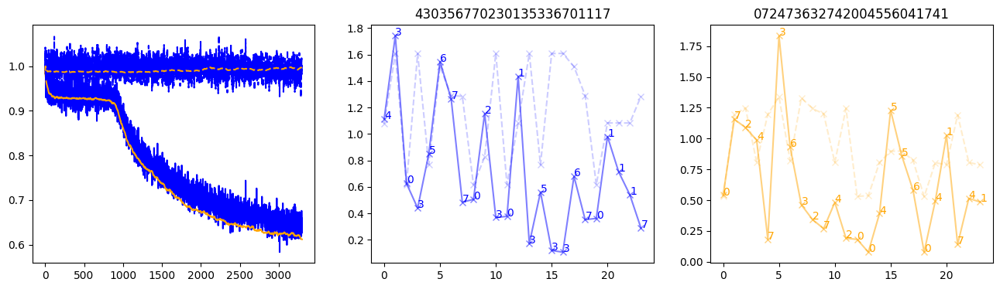

 34%|███▍      | 3400/10000 [01:57<03:24, 32.28it/s, loss=0.664, nar_loss=0.994]

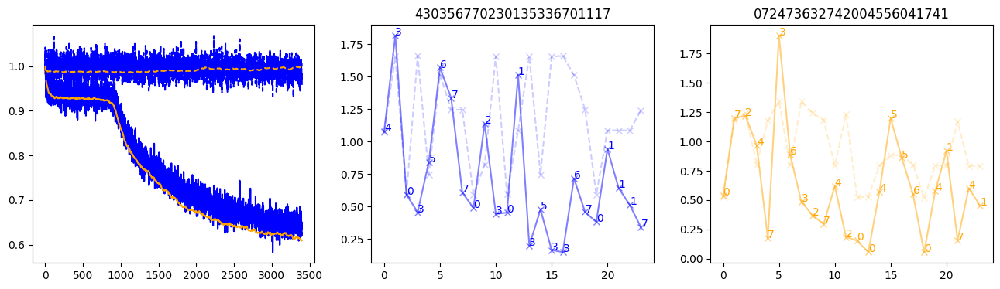

 35%|███▌      | 3500/10000 [02:01<03:20, 32.40it/s, loss=0.637, nar_loss=0.985]

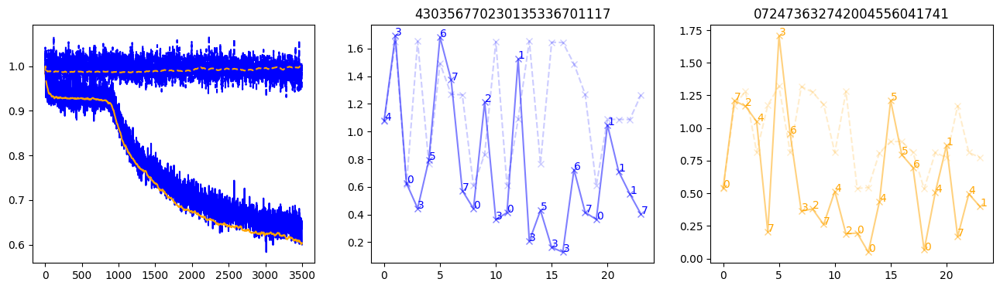

 36%|███▌      | 3600/10000 [02:05<03:19, 32.11it/s, loss=0.658, nar_loss=1]    

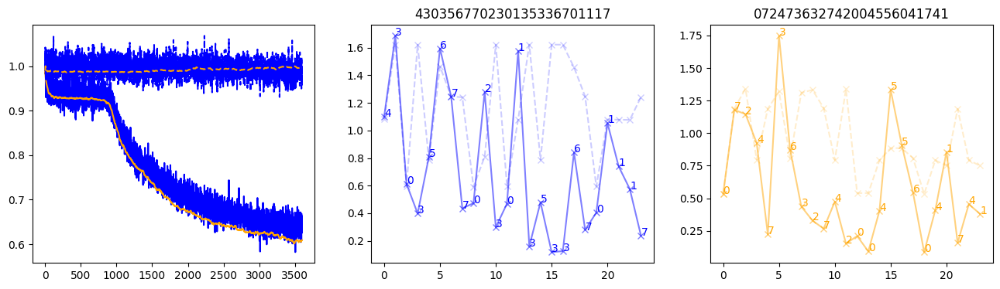

 37%|███▋      | 3700/10000 [02:08<03:15, 32.30it/s, loss=0.658, nar_loss=0.999]

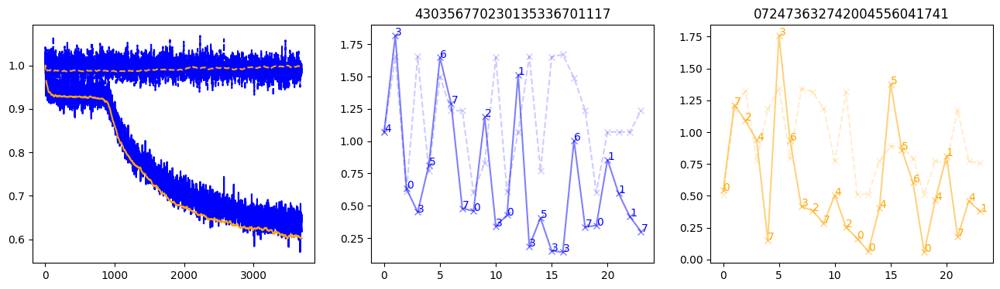

 38%|███▊      | 3799/10000 [02:12<03:10, 32.48it/s, loss=0.641, nar_loss=0.968]

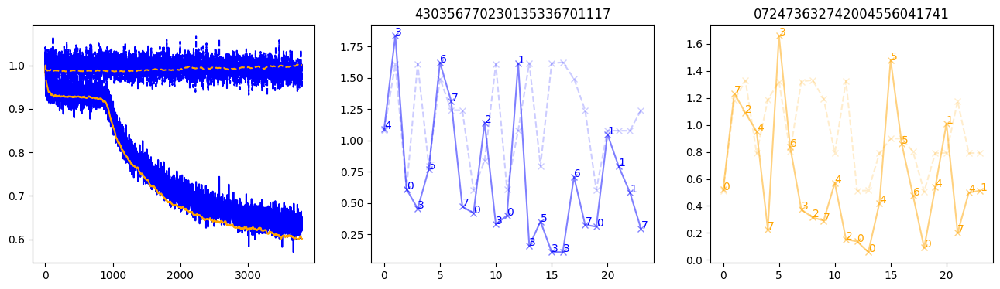

 39%|███▉      | 3899/10000 [02:15<03:08, 32.39it/s, loss=0.63, nar_loss=0.997] 

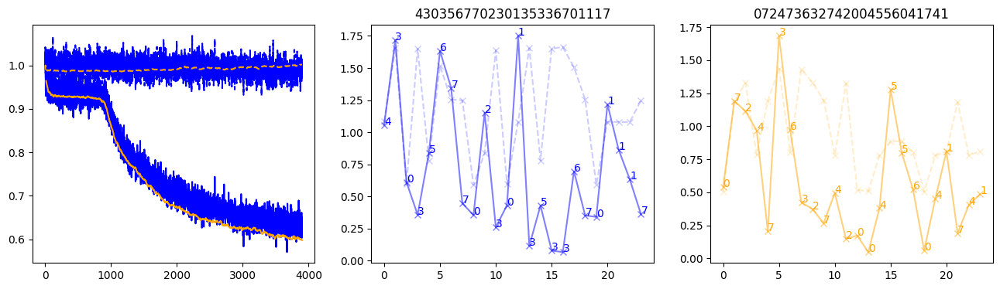

 40%|███▉      | 3999/10000 [02:19<03:05, 32.30it/s, loss=0.641, nar_loss=0.989]

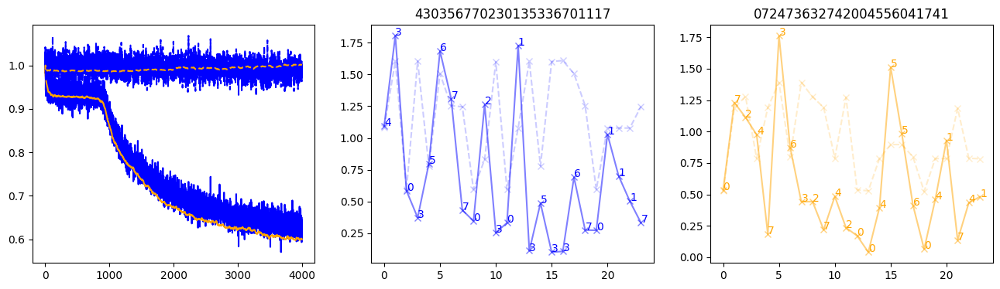

 41%|████      | 4099/10000 [02:23<02:59, 32.82it/s, loss=0.641, nar_loss=0.991]

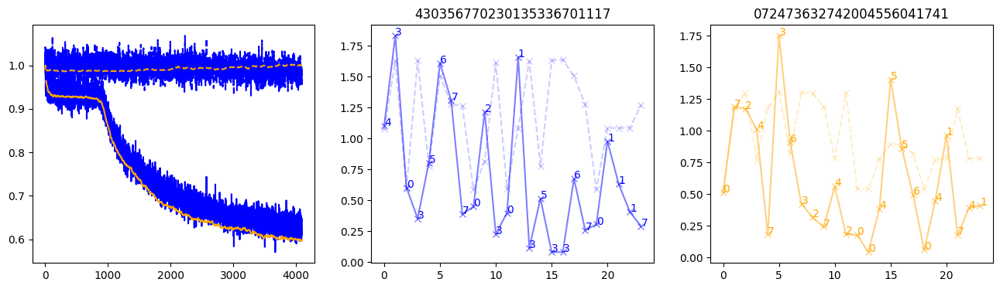

 42%|████▏     | 4199/10000 [02:26<02:59, 32.30it/s, loss=0.615, nar_loss=1.01] 

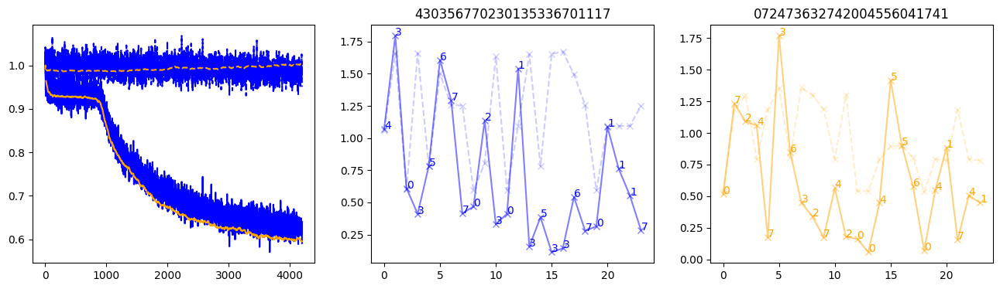

 43%|████▎     | 4299/10000 [02:30<02:56, 32.35it/s, loss=0.619, nar_loss=0.984]

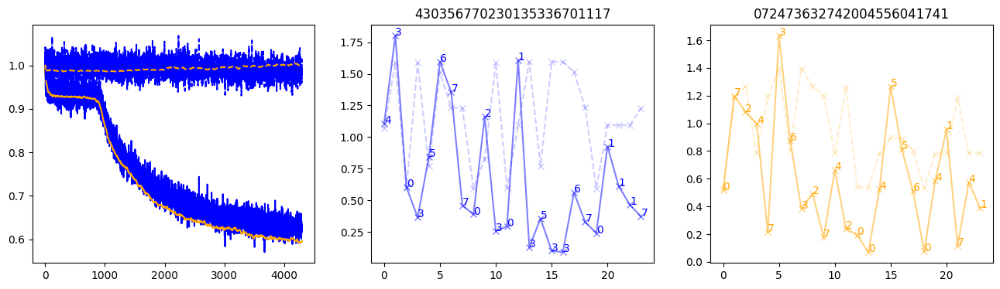

 44%|████▍     | 4399/10000 [02:33<02:53, 32.36it/s, loss=0.616, nar_loss=0.995]

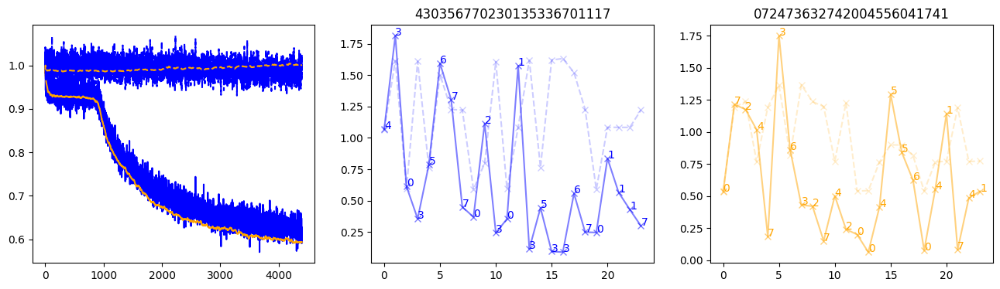

 45%|████▍     | 4499/10000 [02:37<02:49, 32.43it/s, loss=0.63, nar_loss=1.01]  

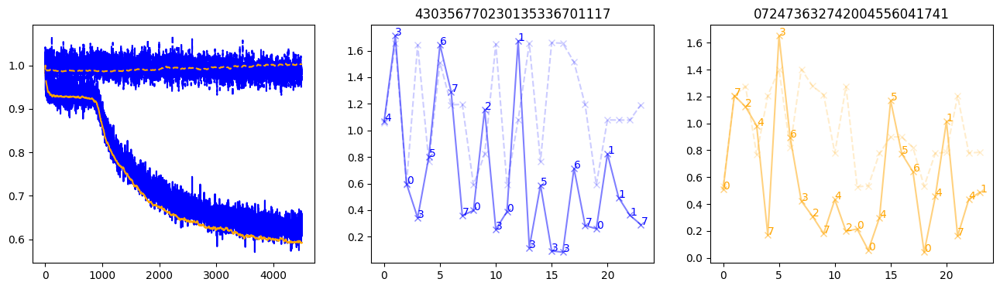

 46%|████▌     | 4599/10000 [02:41<02:46, 32.41it/s, loss=0.603, nar_loss=0.962]

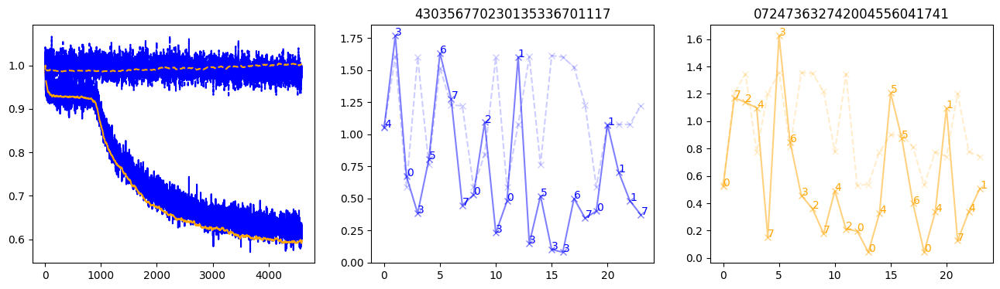

 47%|████▋     | 4699/10000 [02:44<02:43, 32.50it/s, loss=0.627, nar_loss=0.962]

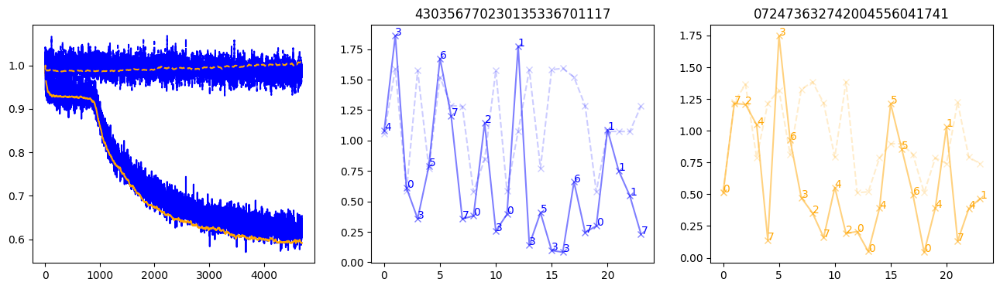

 48%|████▊     | 4799/10000 [02:48<02:42, 32.10it/s, loss=0.634, nar_loss=0.993]

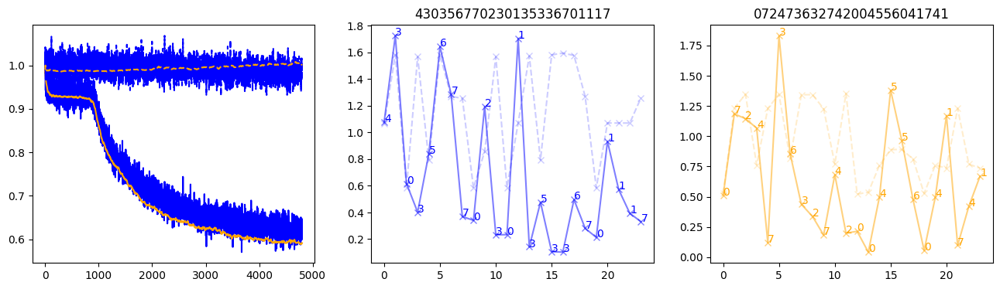

 49%|████▉     | 4899/10000 [02:52<02:37, 32.29it/s, loss=0.611, nar_loss=0.987]

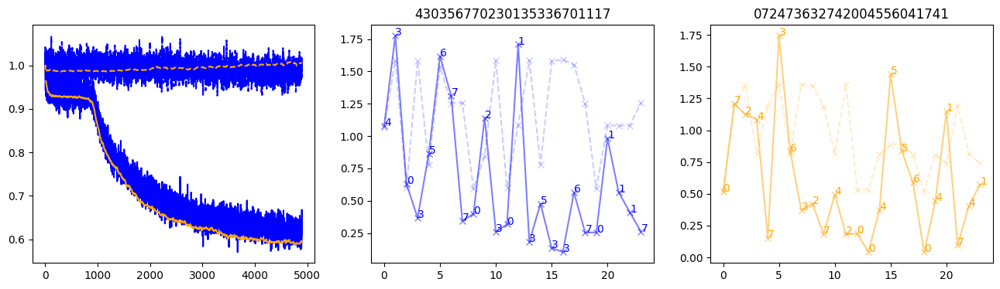

 50%|████▉     | 4999/10000 [02:55<02:34, 32.35it/s, loss=0.602, nar_loss=0.955]

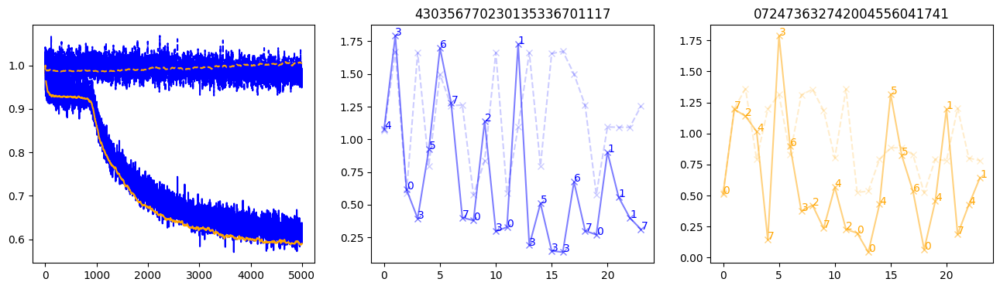

 51%|█████     | 5099/10000 [02:59<02:31, 32.33it/s, loss=0.631, nar_loss=0.99] 

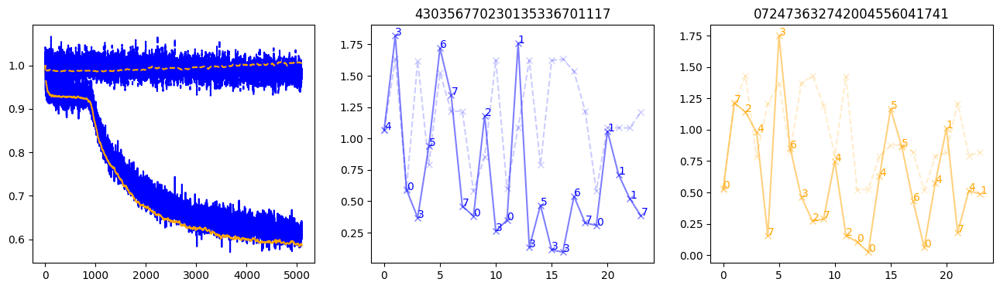

 52%|█████▏    | 5199/10000 [03:03<02:26, 32.70it/s, loss=0.607, nar_loss=0.979]

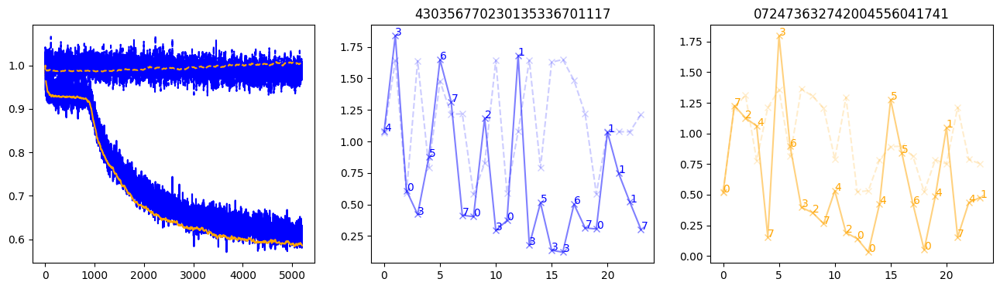

 53%|█████▎    | 5299/10000 [03:06<02:25, 32.37it/s, loss=0.611, nar_loss=0.968]

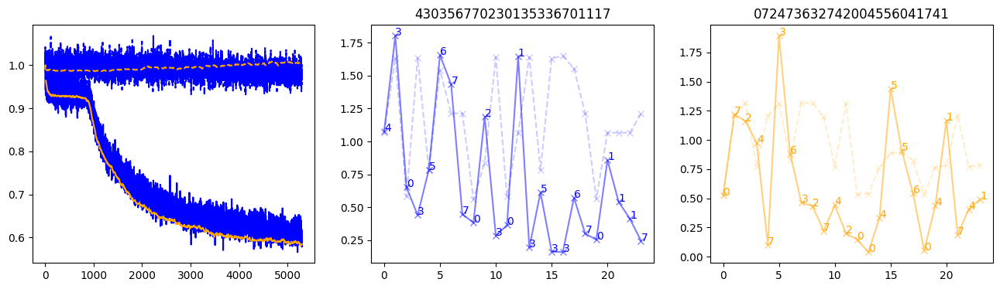

 54%|█████▍    | 5399/10000 [03:10<02:20, 32.70it/s, loss=0.615, nar_loss=0.998]

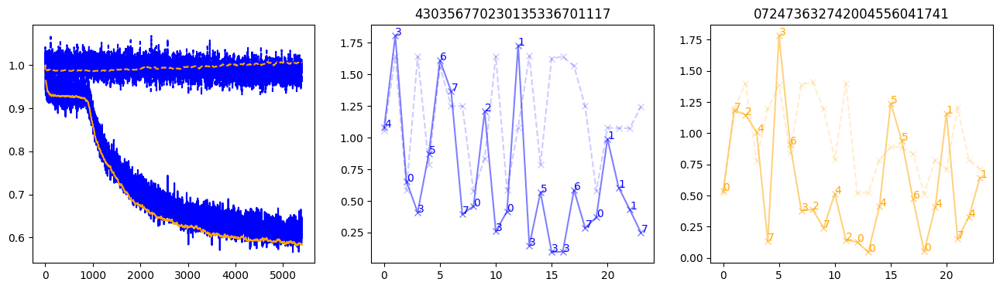

 55%|█████▍    | 5499/10000 [03:13<02:18, 32.48it/s, loss=0.595, nar_loss=0.955]

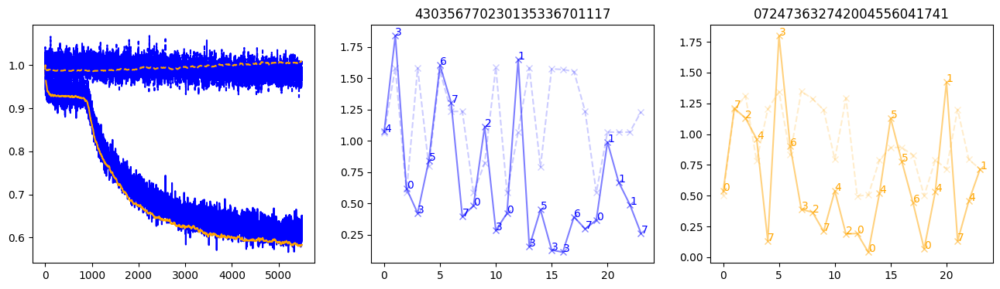

 56%|█████▌    | 5599/10000 [03:17<02:15, 32.47it/s, loss=0.617, nar_loss=0.994]

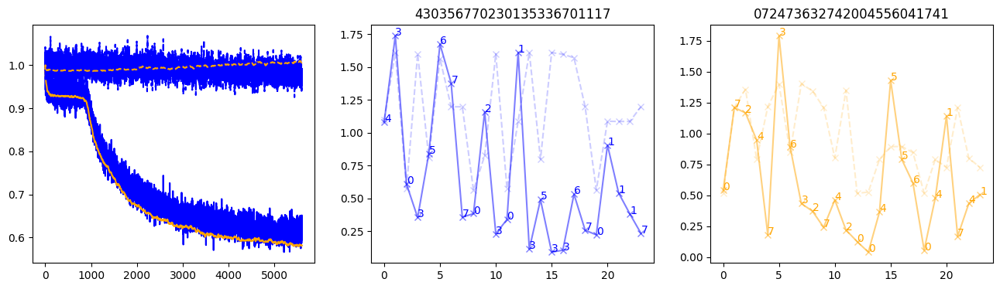

 57%|█████▋    | 5699/10000 [03:21<02:12, 32.49it/s, loss=0.59, nar_loss=0.954] 

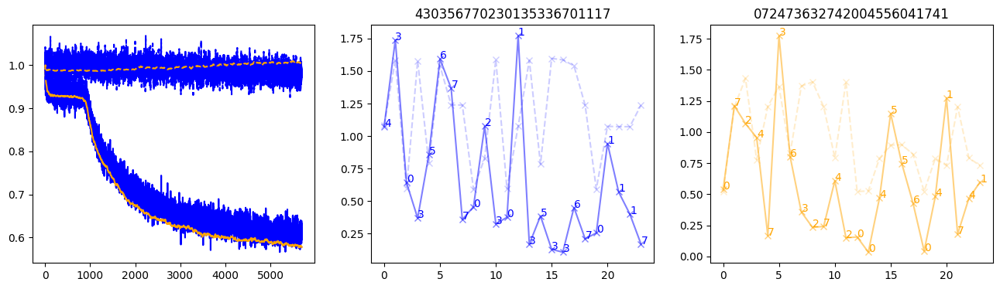

 58%|█████▊    | 5799/10000 [03:24<02:09, 32.38it/s, loss=0.591, nar_loss=0.951]

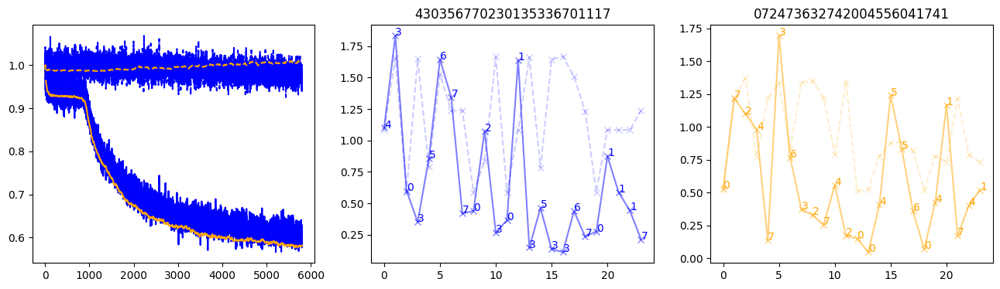

 59%|█████▉    | 5899/10000 [03:28<02:06, 32.46it/s, loss=0.631, nar_loss=0.999]

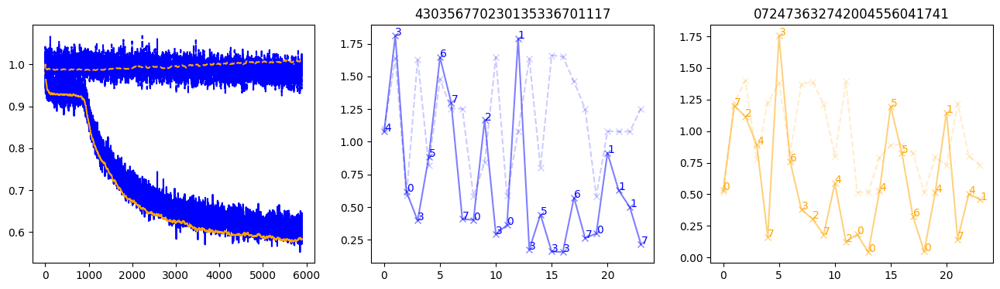

 60%|█████▉    | 5999/10000 [03:32<02:03, 32.43it/s, loss=0.629, nar_loss=1]    

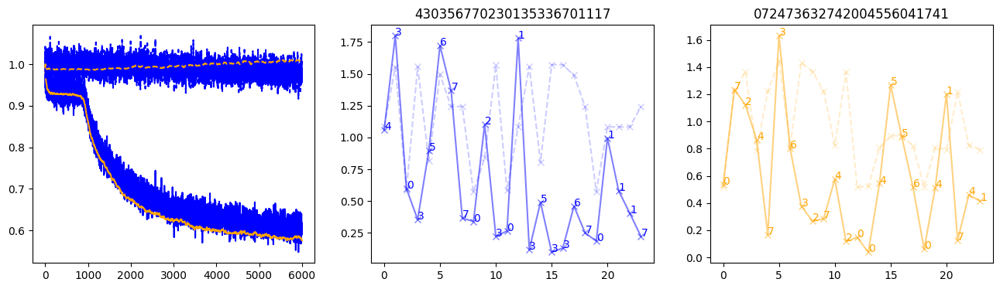

 61%|██████    | 6099/10000 [03:35<02:00, 32.47it/s, loss=0.597, nar_loss=0.975]

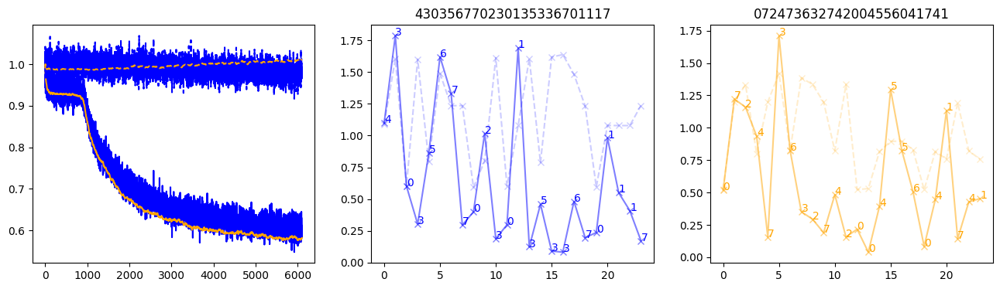

 62%|██████▏   | 6199/10000 [03:39<01:57, 32.41it/s, loss=0.598, nar_loss=0.988]

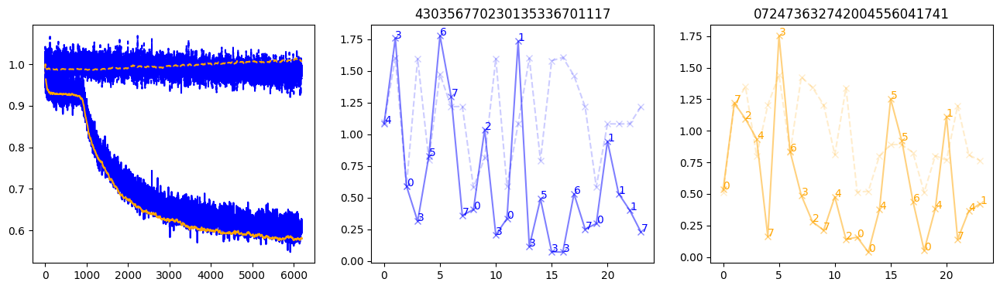

 63%|██████▎   | 6299/10000 [03:43<01:54, 32.39it/s, loss=0.593, nar_loss=0.967]

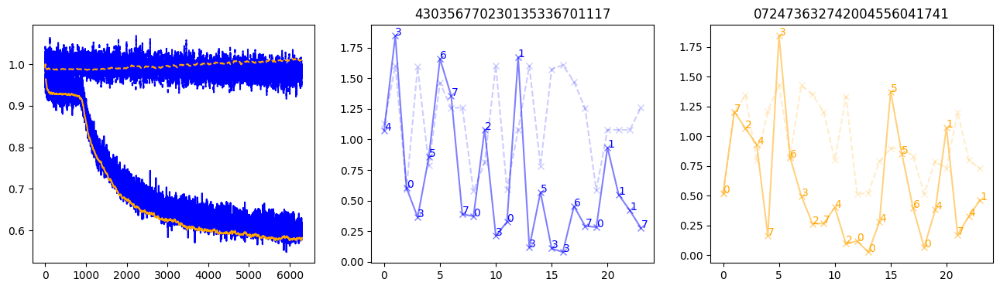

 64%|██████▍   | 6399/10000 [03:47<01:50, 32.49it/s, loss=0.632, nar_loss=1]    

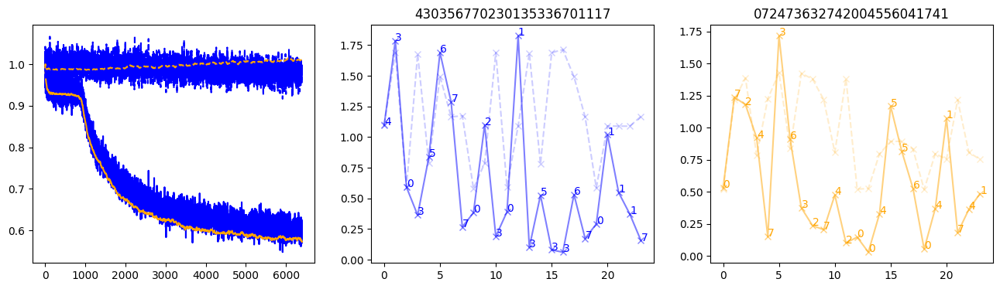

 65%|██████▍   | 6499/10000 [03:50<01:47, 32.51it/s, loss=0.613, nar_loss=0.981]

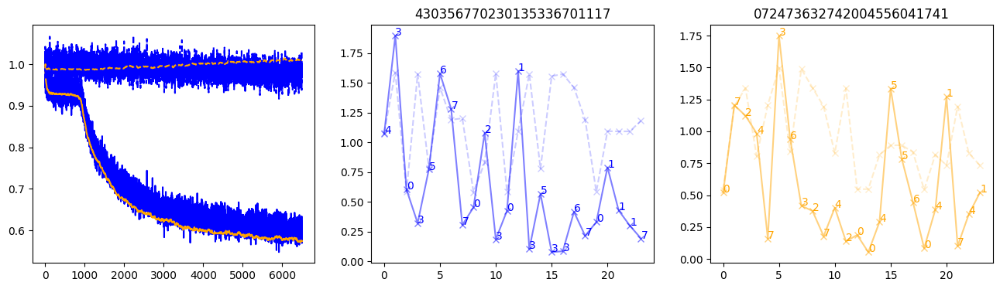

 66%|██████▌   | 6599/10000 [03:54<01:44, 32.46it/s, loss=0.614, nar_loss=0.981]

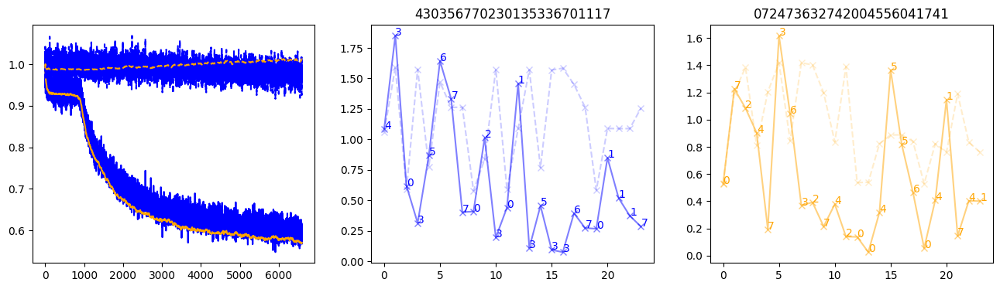

 67%|██████▋   | 6699/10000 [03:58<01:41, 32.65it/s, loss=0.611, nar_loss=0.983]

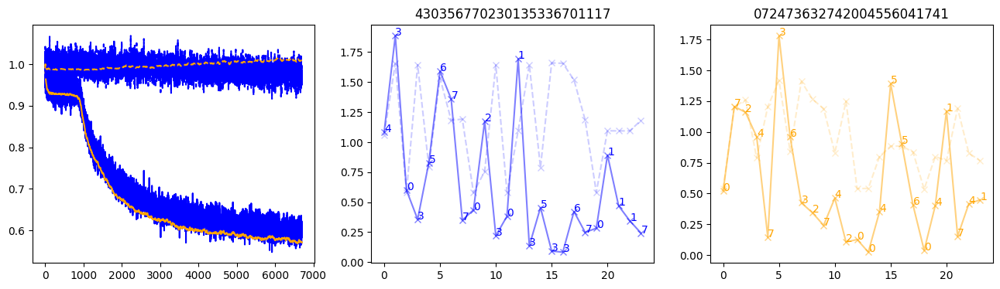

 68%|██████▊   | 6799/10000 [04:01<01:38, 32.34it/s, loss=0.569, nar_loss=0.939]

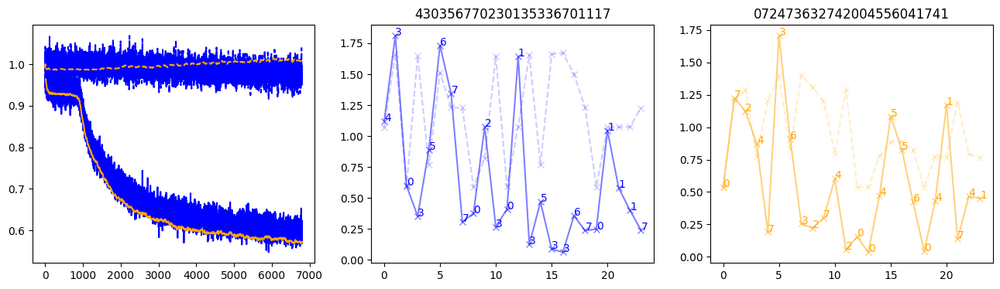

 69%|██████▉   | 6899/10000 [04:05<01:35, 32.42it/s, loss=0.605, nar_loss=0.998]

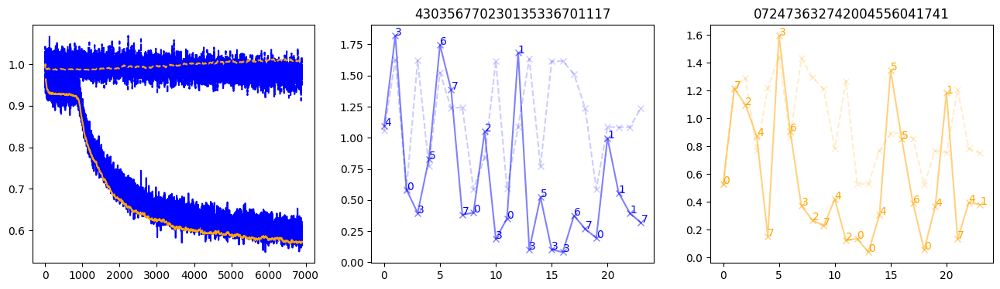

 70%|██████▉   | 6999/10000 [04:09<01:33, 32.07it/s, loss=0.582, nar_loss=0.969]

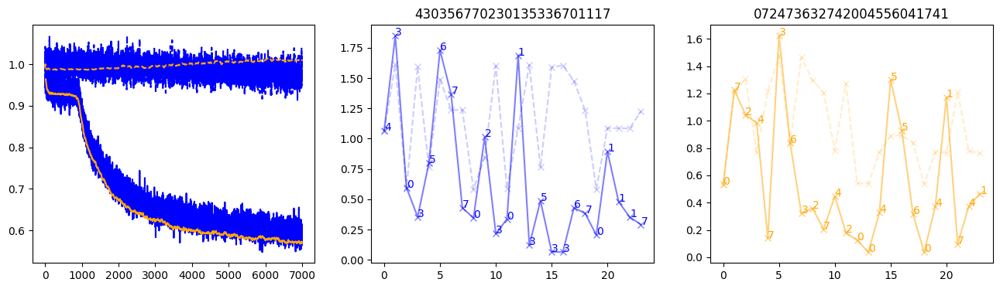

 71%|███████   | 7099/10000 [04:13<01:29, 32.28it/s, loss=0.61, nar_loss=0.978] 

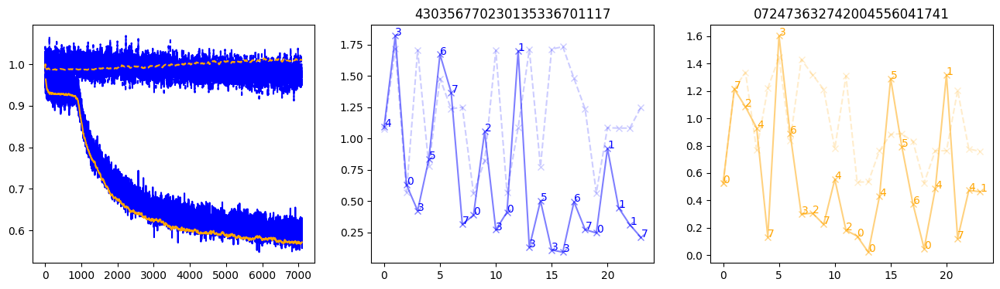

 72%|███████▏  | 7199/10000 [04:16<01:25, 32.80it/s, loss=0.588, nar_loss=0.969]

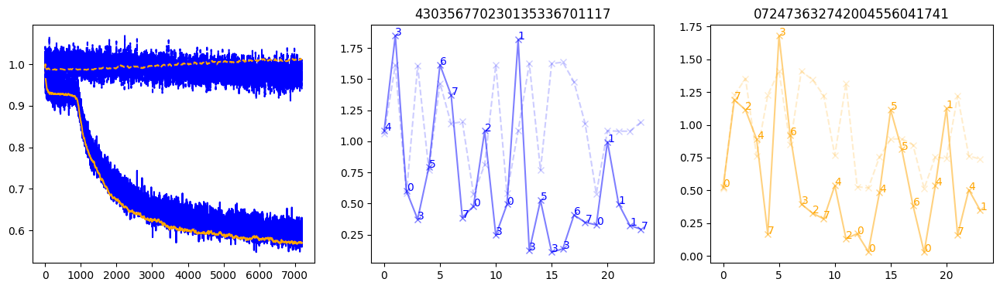

 73%|███████▎  | 7299/10000 [04:20<01:23, 32.51it/s, loss=0.6, nar_loss=0.985]  

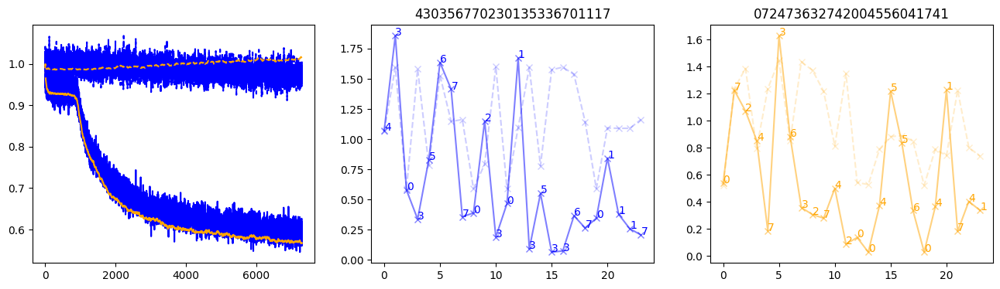

 74%|███████▍  | 7399/10000 [04:24<01:18, 32.93it/s, loss=0.604, nar_loss=0.969]

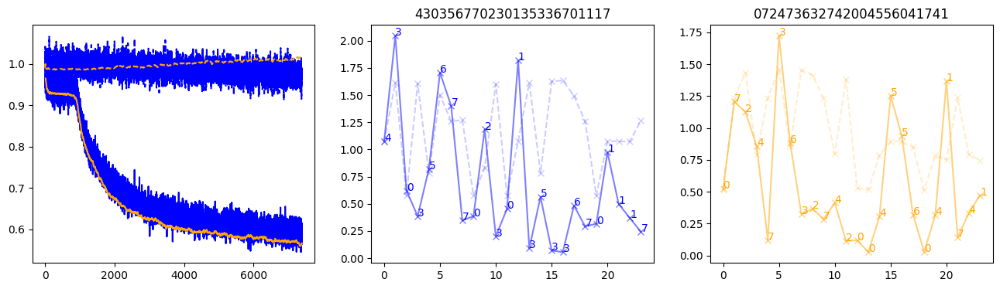

 75%|███████▍  | 7499/10000 [04:28<01:17, 32.43it/s, loss=0.618, nar_loss=0.975]

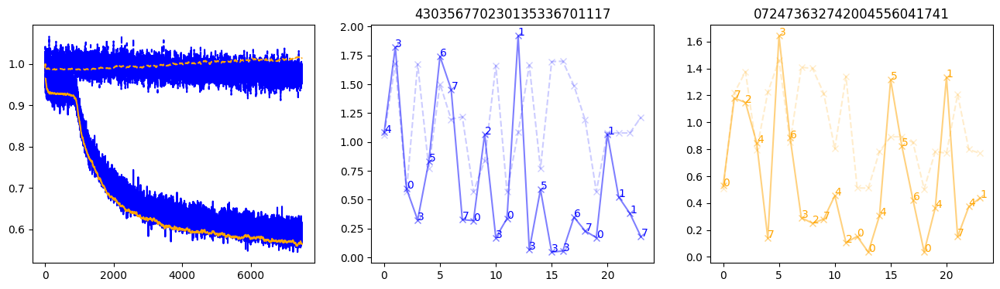

 76%|███████▌  | 7599/10000 [04:31<01:12, 32.96it/s, loss=0.598, nar_loss=0.976]

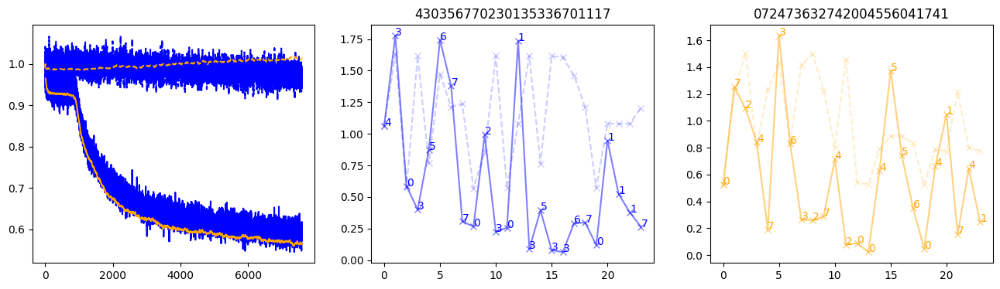

 77%|███████▋  | 7699/10000 [04:35<01:09, 32.98it/s, loss=0.589, nar_loss=0.998]

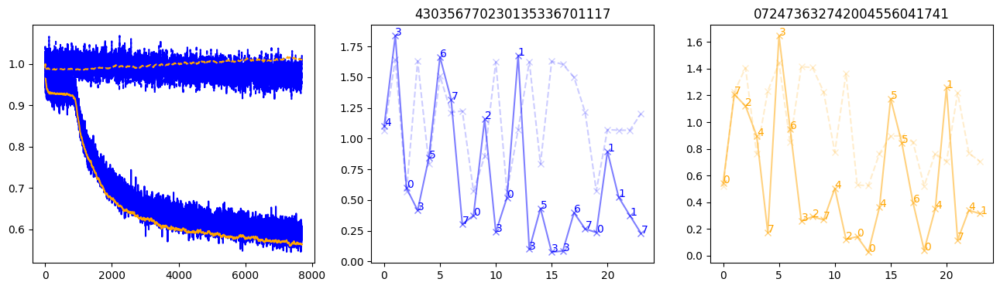

 78%|███████▊  | 7799/10000 [04:39<01:07, 32.70it/s, loss=0.565, nar_loss=0.97] 

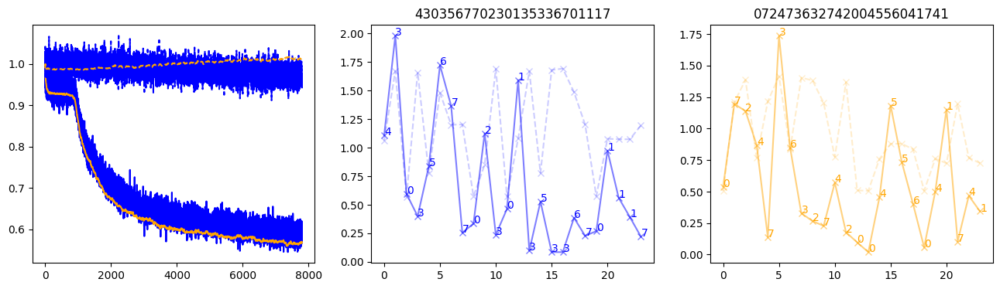

 79%|███████▉  | 7899/10000 [04:43<01:04, 32.58it/s, loss=0.592, nar_loss=0.991]

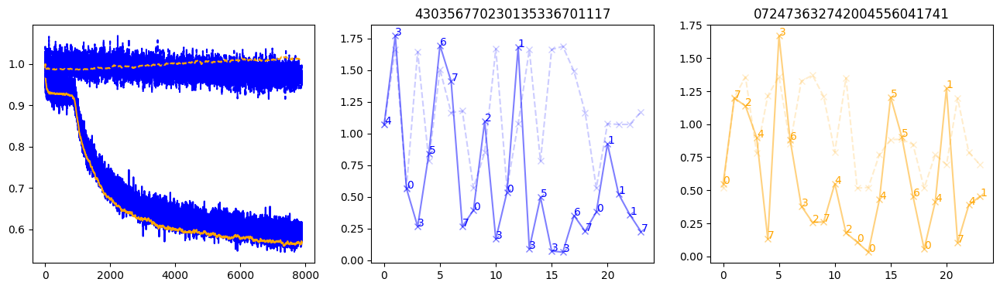

 80%|███████▉  | 7999/10000 [04:46<01:01, 32.60it/s, loss=0.576, nar_loss=0.964]

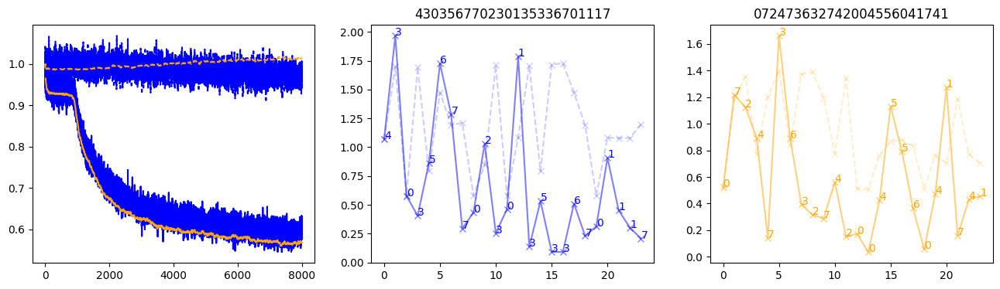

 81%|████████  | 8099/10000 [04:50<00:58, 32.75it/s, loss=0.583, nar_loss=0.97] 

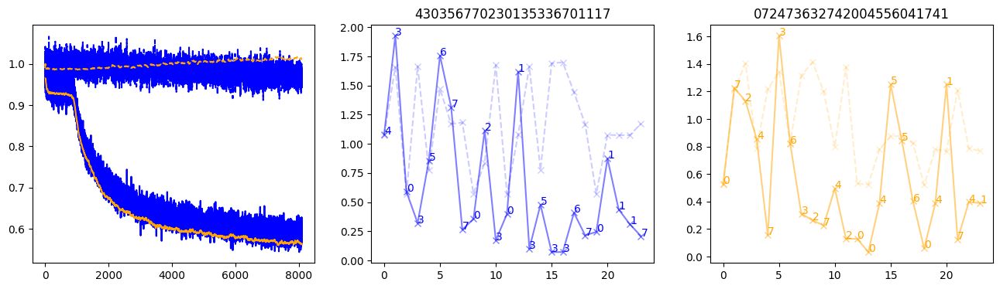

 82%|████████▏ | 8199/10000 [04:54<00:55, 32.47it/s, loss=0.587, nar_loss=0.993]

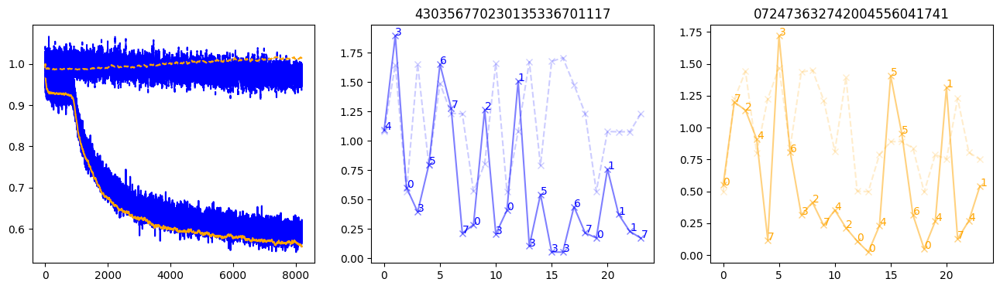

 83%|████████▎ | 8299/10000 [04:58<00:52, 32.49it/s, loss=0.574, nar_loss=0.966]

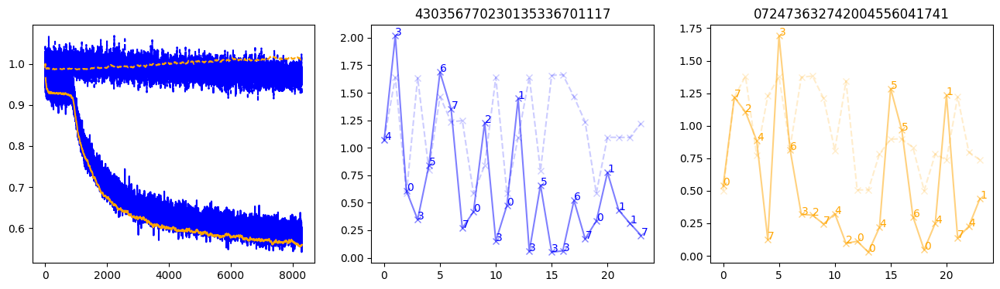

 84%|████████▍ | 8399/10000 [05:02<00:49, 32.24it/s, loss=0.591, nar_loss=0.972]

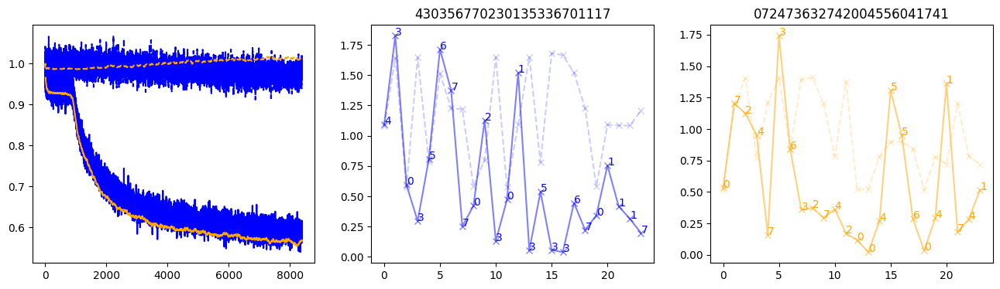

 85%|████████▍ | 8499/10000 [05:05<00:46, 32.23it/s, loss=0.564, nar_loss=0.952]

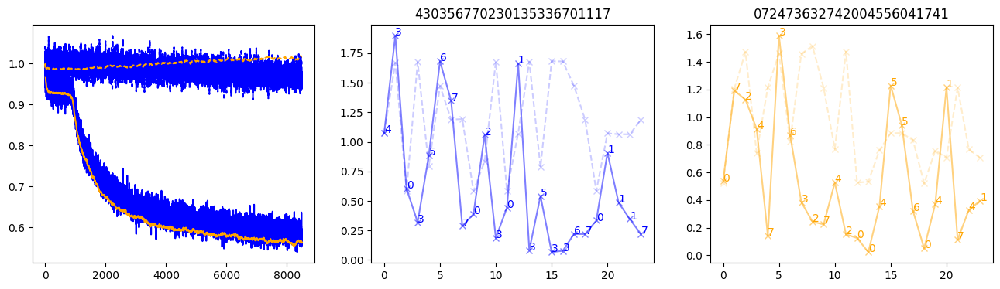

 86%|████████▌ | 8599/10000 [05:09<00:43, 32.36it/s, loss=0.584, nar_loss=0.972]

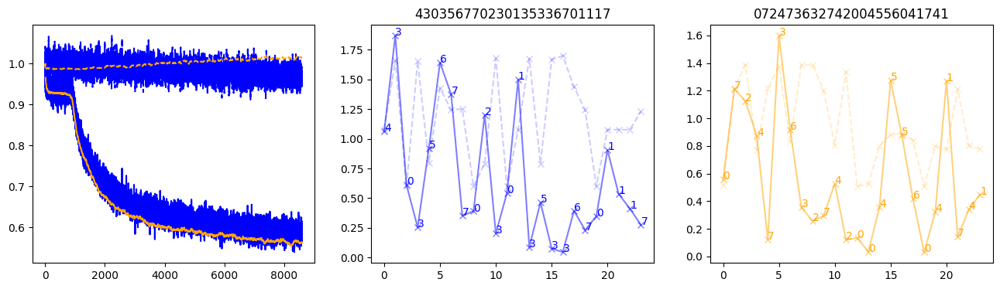

 87%|████████▋ | 8699/10000 [05:13<00:40, 32.22it/s, loss=0.579, nar_loss=0.948]

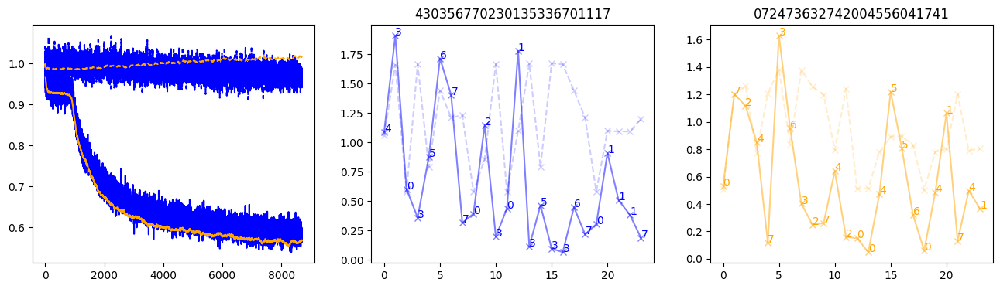

 88%|████████▊ | 8799/10000 [05:17<00:36, 32.83it/s, loss=0.584, nar_loss=0.979]

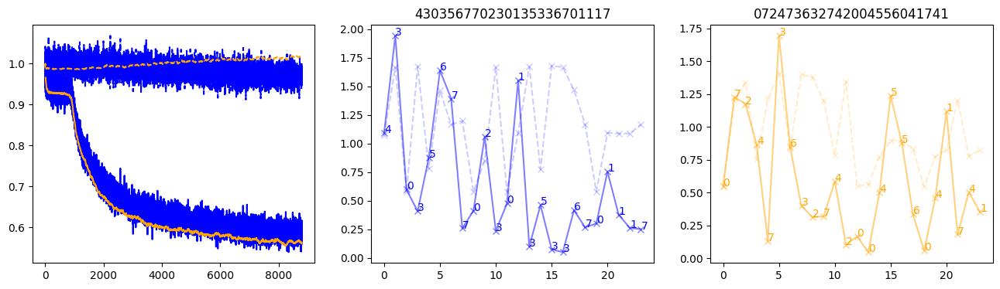

 89%|████████▉ | 8899/10000 [05:21<00:33, 32.51it/s, loss=0.606, nar_loss=0.981]

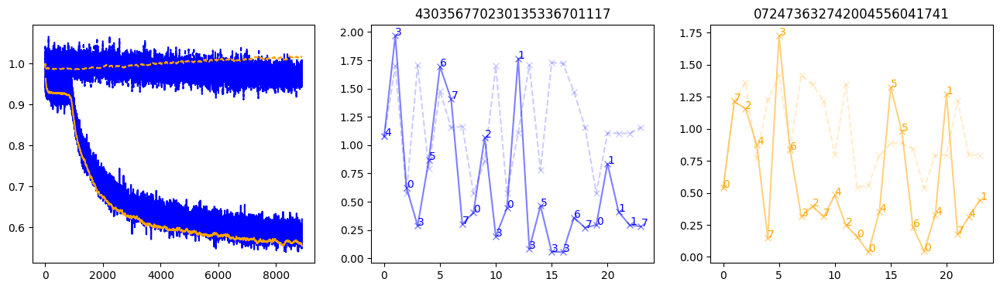

 90%|████████▉ | 8999/10000 [05:25<00:30, 32.46it/s, loss=0.574, nar_loss=0.962]

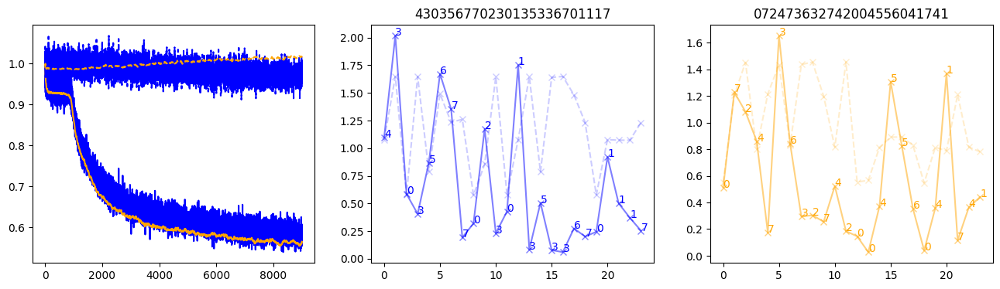

 91%|█████████ | 9099/10000 [05:29<00:27, 32.38it/s, loss=0.567, nar_loss=0.966]

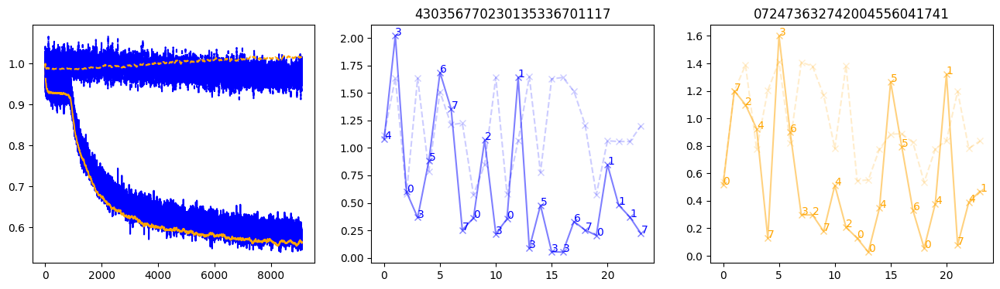

 92%|█████████▏| 9199/10000 [05:32<00:24, 32.41it/s, loss=0.569, nar_loss=0.977]

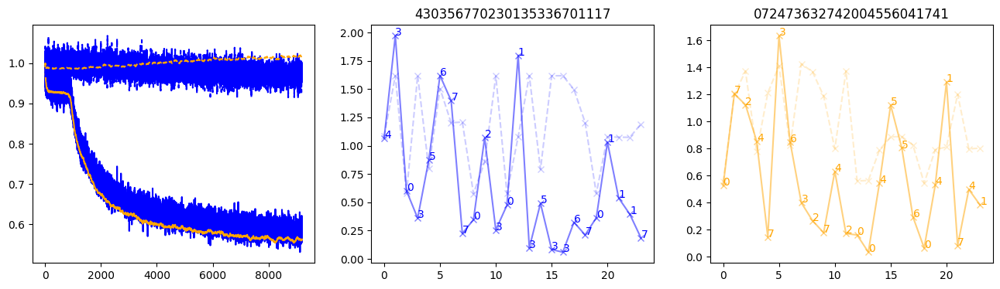

 93%|█████████▎| 9299/10000 [05:36<00:21, 32.48it/s, loss=0.527, nar_loss=0.941]

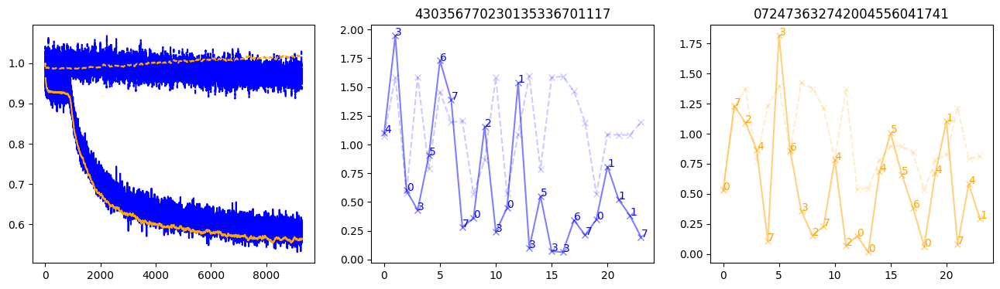

 94%|█████████▍| 9399/10000 [05:40<00:18, 32.39it/s, loss=0.566, nar_loss=0.973]

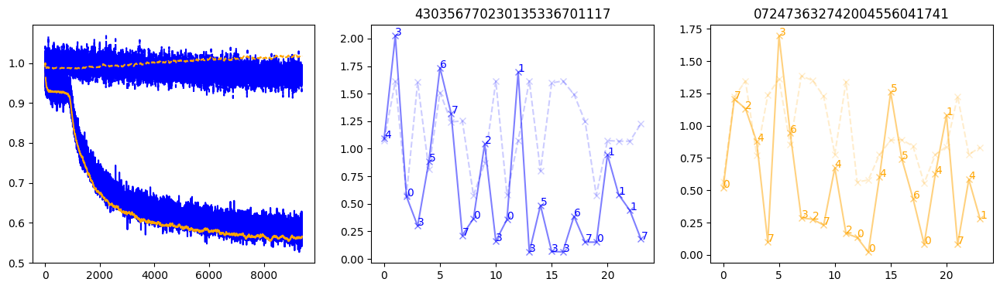

 95%|█████████▍| 9499/10000 [05:44<00:15, 32.46it/s, loss=0.577, nar_loss=0.979]

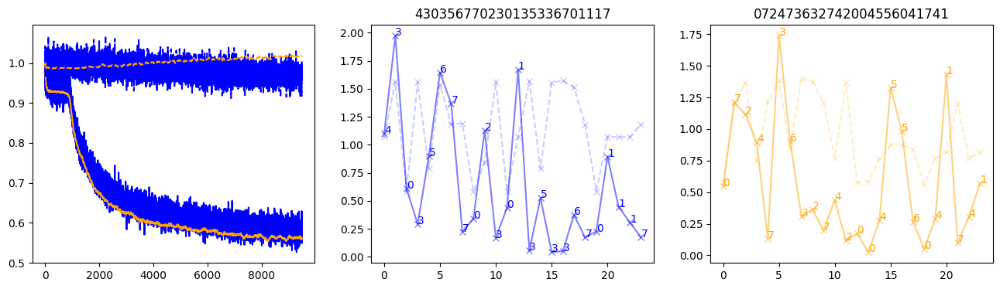

 96%|█████████▌| 9599/10000 [05:48<00:12, 32.46it/s, loss=0.555, nar_loss=0.967]

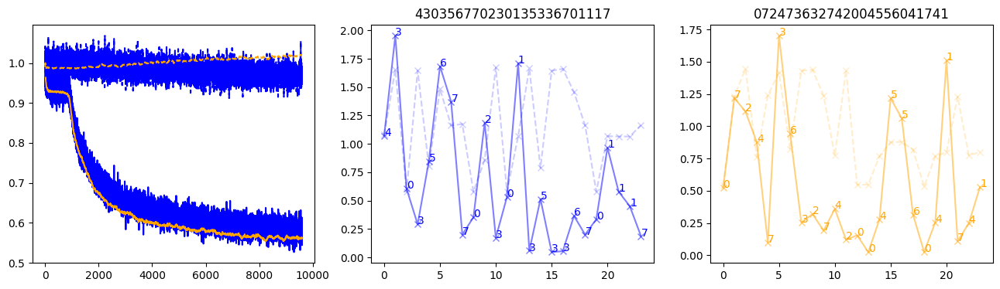

 97%|█████████▋| 9699/10000 [05:52<00:09, 32.53it/s, loss=0.572, nar_loss=0.973]

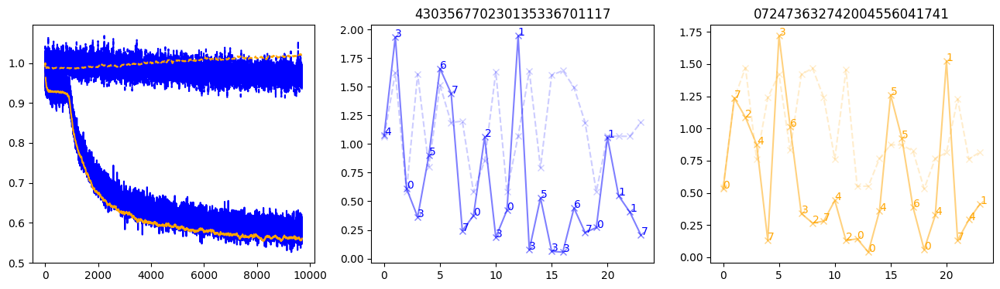

 98%|█████████▊| 9799/10000 [05:56<00:06, 32.59it/s, loss=0.557, nar_loss=0.987]

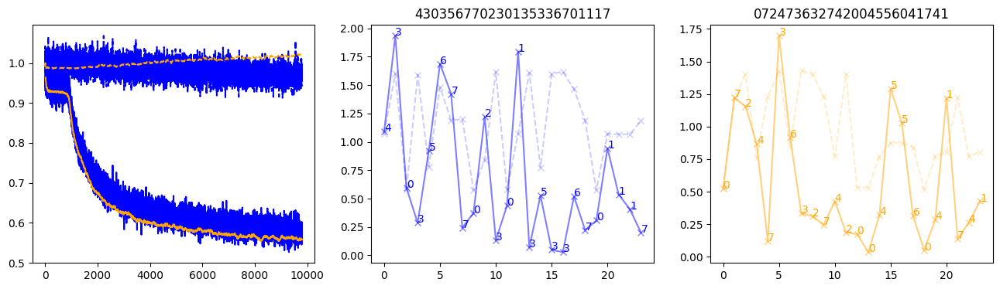

 99%|█████████▉| 9899/10000 [06:00<00:03, 31.94it/s, loss=0.586, nar_loss=0.943]

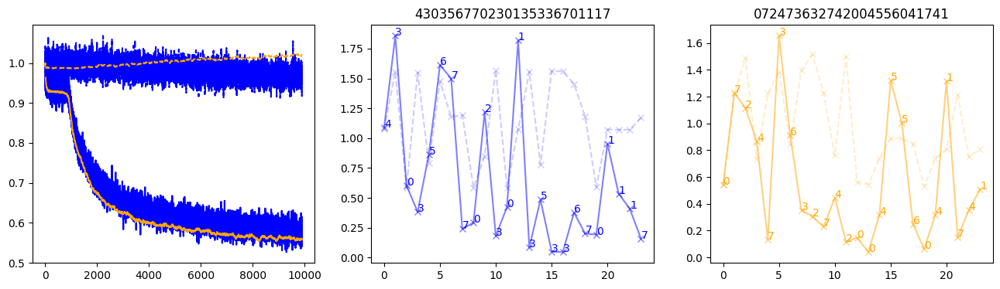

100%|██████████| 10000/10000 [06:04<00:00, 27.47it/s, loss=0.586, nar_loss=0.964]


In [22]:
device = 'cuda:1'
model = Model().to(device)
nar_model = Model().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
nar_optimizer = torch.optim.Adam(nar_model.parameters(), lr=0.001)

Nsteps = 10000
train_losses = torch.zeros(Nsteps)
valid_losses = torch.zeros(Nsteps)
valid_stepwise_losses = torch.zeros(Nsteps, T, Nbatch)

nar_train_losses = torch.zeros(Nsteps)
nar_valid_losses = torch.zeros(Nsteps)
nar_valid_stepwise_losses = torch.zeros(Nsteps, T, Nbatch)


with trange(Nsteps) as t:
    for step in t:
        optimizer.zero_grad()
        nar_optimizer.zero_grad()

        x, nar_x, y_targets = make_batch(train_inputs, train_outputs)

        y_targets = y_targets.to(device)
        y = model(x.to(device))
        
        loss = (y - y_targets.detach()).pow(2).mean()
        loss.backward()
        optimizer.step()
        train_losses[step] = loss.item()

        nar_y = nar_model(nar_x.to(device))

        nar_loss = (nar_y - y_targets.detach()).pow(2).mean()
        nar_loss.backward()
        nar_optimizer.step()
        nar_train_losses[step] = nar_loss.item()

        t.set_postfix(loss=loss.item(), nar_loss=nar_loss.item())

        with torch.inference_mode():
            sequences = make_sequences(valid_inputs, generator=torch.Generator().manual_seed(0))[1]
            x_valid, nar_x_valid, y_targets_valid = make_batch(valid_inputs, valid_outputs, generator=torch.Generator().manual_seed(0))
            y_targets_valid = y_targets_valid.to(device)
            y_valid = model(x_valid.to(device))
            nar_y_valid = nar_model(nar_x_valid.to(device))

            loss_valid = (y_valid - y_targets_valid).pow(2).mean()
            nar_loss_valid = (nar_y_valid - y_targets_valid).pow(2).mean()

            loss_valid_stepwise = (y_valid - y_targets_valid).pow(2).mean(dim=-1)
            valid_losses[step] = loss_valid.item()
            valid_stepwise_losses[step, :, :] = loss_valid_stepwise.cpu()

            nar_loss_valid_stepwise = (nar_y_valid - y_targets_valid).pow(2).mean(dim=-1)
            nar_valid_losses[step] = nar_loss_valid.item()
            nar_valid_stepwise_losses[step, :, :] = nar_loss_valid_stepwise.cpu()

        if step and step % 100 == 0:
            fig, (axl, axc, axr) = plt.subplots(1, 3, figsize=(16, 4))

            axl.plot(train_losses[:step], color='blue')
            axl.plot(valid_losses[:step], color='orange')
            axl.plot(nar_train_losses[:step], linestyle='--', color='blue')
            axl.plot(nar_valid_losses[:step], linestyle='--', color='orange')

            axc.plot(torch.arange(T), valid_stepwise_losses[step, :, 0], color='blue', alpha=0.5, marker='x')
            for (i, j, text) in zip(torch.arange(T), valid_stepwise_losses[step, :, 0], sequences[0]):
                axc.text(i, j, f'{text}', color='blue')

            axc.plot(torch.arange(T), nar_valid_stepwise_losses[step, :, 0], color='blue', alpha=0.2, marker='x', linestyle='--')
    
            axc.set_title(''.join([str(x) for x in make_sequences(valid_inputs, generator=torch.Generator().manual_seed(0))[1][0].tolist()]))

            axr.plot(torch.arange(T), valid_stepwise_losses[step, :, 1], color='orange', alpha=0.5, marker='x')
            for (i, j, text) in zip(torch.arange(T), valid_stepwise_losses[step, :, 1], sequences[1]):
                axr.text(i, j, f'{text}', color='orange')

            axr.plot(torch.arange(T), nar_valid_stepwise_losses[step, :, 1], color='orange', alpha=0.2, marker='x', linestyle='--')

            axr.set_title(''.join([str(x) for x in make_sequences(valid_inputs, generator=torch.Generator().manual_seed(0))[1][1].tolist()]))
            plt.show()